# 2024-03-26 34 - First look at new models.ipynb

Clone of `2024-03-07 30v2 - Implementing gridsearch and analyzing its impact--plus-koopa.ipynb`. 

Initially to have a glimpse at the new models run in March 25-26 during rebuttals. Not meant to make it into the final paper.


## Parameters

## Libraries and setup

In [5]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [7]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
from IPython.display import display, Markdown, Latex

In [8]:
from utils import wandb_utils

## Data Download

### Resilience data

In [21]:
real_df_resilience=pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
# For now, only resilience

real_df_resilience = real_df_resilience.query('constraint_type=="constant_resilience" or constraint_type=="erm"')

In [22]:
real_df_resilience[['constraint_type','resilient_lr']].drop_duplicates()

,constraint_type,resilient_lr
169344,constant_resilience,0.1
764640,erm,NaN


In [8]:
CONSTRAINT_TYPE='constant'

### Non resilience data

In [11]:
# #READ
real_df=pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
# For now, only resilience

real_df = real_df.query('constraint_type=="constant" or constraint_type=="erm"')
CONSTRAINT_TYPE='constant'

In [44]:
# #
# new_missing_erms=wandb_utils.get_experiment_data("Autoformer","alelab",experiment_tags=experiment_tags,query_dict={"$and": [
#                         {"tags": {"$in": ['erm_rebuttal_newmodels']}},
#                         {"state": "finished"},
# ]})

  2%|▏         | 3/190 [00:00<00:07, 25.49it/s]

WARNING!! Missing pointwise/cvar/0.01 in run hmi3lxxs on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 9hu9f3df on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run c3zzb05x on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vjbq485j on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run b7s8jptd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nilwbio1 on sweep None. Filling all poitwisewith NAN.


  5%|▌         | 10/190 [00:00<00:06, 26.96it/s]

WARNING!! Missing pointwise/cvar/0.01 in run jgykcbi0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ci9ssydd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run q3x2oux3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rnbsyq2k on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mw9t2ygl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nmhkgaj4 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ssq2do8x on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


  7%|▋         | 13/190 [00:12<04:18,  1.46s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nl9kpfsp on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


  7%|▋         | 14/190 [00:18<06:21,  2.17s/it]

WARNING!! Missing pointwise/cvar/0.01 in run avo2qgiq on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run cfo5eg0t on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


  8%|▊         | 16/190 [00:23<06:26,  2.22s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 64uvszfp on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


  9%|▉         | 18/190 [00:35<09:49,  3.43s/it]

WARNING!! Missing pointwise/cvar/0.01 in run o1qr4wlh on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ovn7p5dd on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 10%|█         | 19/190 [00:41<10:48,  3.79s/it]

WARNING!! Missing pointwise/cvar/0.01 in run exmg2gg0 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 11%|█         | 20/190 [00:44<10:23,  3.67s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 5ivk4sa1 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 11%|█         | 21/190 [00:46<09:00,  3.20s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ugz4wtkz on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 12%|█▏        | 22/190 [00:58<15:13,  5.44s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 6o0rkyy5 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 12%|█▏        | 23/190 [01:04<15:11,  5.46s/it]

WARNING!! Missing pointwise/cvar/0.01 in run kknqm2fe on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 13%|█▎        | 24/190 [01:07<13:23,  4.84s/it]

WARNING!! Missing pointwise/cvar/0.01 in run fryk3j68 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 13%|█▎        | 25/190 [01:08<10:49,  3.94s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 2ay68dwq on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 14%|█▎        | 26/190 [01:21<17:20,  6.34s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 9ssbipuu on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 14%|█▍        | 27/190 [01:22<13:02,  4.80s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 2qa1s6bx on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 15%|█▍        | 28/190 [01:23<09:47,  3.63s/it]

WARNING!! Missing pointwise/cvar/0.01 in run l2jupa3o on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 15%|█▌        | 29/190 [01:23<07:19,  2.73s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 8lot5xux on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 16%|█▌        | 30/190 [01:23<05:26,  2.04s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 3rb4tf5u on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 16%|█▋        | 31/190 [01:24<04:34,  1.72s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yd647pro on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 17%|█▋        | 32/190 [01:25<03:48,  1.44s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ntd1t0gm on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 17%|█▋        | 33/190 [01:26<03:06,  1.19s/it]

WARNING!! Missing pointwise/cvar/0.01 in run cc0cjrv3 on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 18%|█▊        | 34/190 [01:26<02:28,  1.05it/s]

WARNING!! Missing pointwise/cvar/0.01 in run igx8r6rf on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 18%|█▊        | 35/190 [01:27<02:28,  1.04it/s]

WARNING!! Missing pointwise/cvar/0.01 in run al4zna2k on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 19%|█▉        | 36/190 [01:33<05:59,  2.33s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4ngi0imp on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 19%|█▉        | 37/190 [01:34<04:46,  1.87s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4km18dna on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 20%|██        | 38/190 [01:34<03:46,  1.49s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vuppzm29 on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 21%|██        | 39/190 [01:35<02:55,  1.16s/it]

WARNING!! Missing pointwise/cvar/0.01 in run flfhnh21 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run dko5cedn on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 22%|██▏       | 41/190 [01:36<02:09,  1.15it/s]

WARNING!! Missing pointwise/cvar/0.01 in run d7uxmgk2 on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 22%|██▏       | 42/190 [01:36<02:05,  1.18it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 935eqlxp on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 23%|██▎       | 43/190 [01:37<01:55,  1.28it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 2gewew4y on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 23%|██▎       | 44/190 [01:37<01:39,  1.47it/s]

WARNING!! Missing pointwise/cvar/0.01 in run ecv9yofu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run z024ola8 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 24%|██▍       | 46/190 [01:41<02:58,  1.24s/it]

WARNING!! Missing pointwise/cvar/0.01 in run k6t5xftm on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 42kfjos8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run n5w61u3p on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 26%|██▌       | 49/190 [01:43<02:07,  1.11it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 54fe1d4f on sweep None. Filling all poitwisewith NAN.


 28%|██▊       | 54/190 [01:52<02:50,  1.25s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 86kk1xh2 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ssafm6eb on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run hi58ycu8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run x98khc6x on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ugo2sq09 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run c2nb9f6u on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4su66w4s on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run j1tbt31j on sweep None. Filling all poitwisewith NAN.


 35%|███▍      | 66/190 [01:53<00:37,  3.27it/s]

WARNING!! Missing pointwise/cvar/0.01 in run r4f7jcyc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run xg7l1jgd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run lo7jnfvl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 3l8p07md on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qr5o2sit on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run p4ko65xt on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vsrqp2wj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run x68ozuxw on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run zq0cgt0m on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run lefms10l on sweep None. Filling all poitwisewith NAN.


 38%|███▊      | 73/190 [01:53<00:19,  5.89it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 9x173dui on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jb0u4czc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run w1h7en0v on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run wvi5llo2 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qccwcqdf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run gp60p2yf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run koz3xj6o on sweep None. Filling all poitwisewith NAN.


 43%|████▎     | 81/190 [01:53<00:10, 10.40it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 39kg79we on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 1tdp5vim on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run o7ikzvrr on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jqvplbjk on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 478xiytd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 5v8b8l6c on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qsjuehld on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 883m8d4h on sweep None. Filling all poitwisewith NAN.


 47%|████▋     | 89/190 [01:53<00:06, 15.54it/s]

WARNING!! Missing pointwise/cvar/0.01 in run r542nlqy on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run x60dm8fj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run m51xthm0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 3lhwqnhd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4a14ghuc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jiz8j8lt on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run q7rcclus on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ru55vx89 on sweep None. Filling all poitwisewith NAN.


 49%|████▉     | 94/190 [01:54<00:04, 19.48it/s]

WARNING!! Missing pointwise/cvar/0.01 in run rcbabsa1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run zim0b9ie on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run w6aaoqg5 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run dj3k89lq on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 9few0vri on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0upvtnu8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 7zpet8yu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run faczn6ub on sweep None. Filling all poitwisewith NAN.


 52%|█████▏    | 99/190 [01:54<00:04, 22.08it/s]

WARNING!! Missing pointwise/cvar/0.01 in run mnknnvrj on sweep None. Filling all poitwisewith NAN.


 53%|█████▎    | 101/190 [02:06<01:32,  1.04s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 0nl6ofyv on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run pz5bhpkm on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run um3jut0n on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2mefz44b on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 55%|█████▍    | 104/190 [02:19<02:41,  1.88s/it]

WARNING!! Missing pointwise/cvar/0.01 in run snofmdt8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run k3jgic8y on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 56%|█████▌    | 106/190 [02:25<02:58,  2.12s/it]

WARNING!! Missing pointwise/cvar/0.01 in run h9uik6uo on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nzgon4u5 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 57%|█████▋    | 109/190 [02:30<02:41,  1.99s/it]

WARNING!! Missing pointwise/cvar/0.01 in run u2xtjd0v on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ia2y3xtf on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run io5dst33 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 58%|█████▊    | 111/190 [02:50<04:54,  3.73s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1a095lrk on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run e4113710 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 59%|█████▉    | 113/190 [02:53<04:08,  3.22s/it]

WARNING!! Missing pointwise/cvar/0.01 in run uvk1kh68 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 61%|██████    | 115/190 [02:55<03:16,  2.62s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vvkgo5tc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4s1gttk0 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 61%|██████    | 116/190 [03:07<05:02,  4.09s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ym2rnjxx on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run amlokjb0 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 63%|██████▎   | 120/190 [03:13<03:01,  2.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run lqqgbl0c on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run bbedl2fm on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2u2orrgj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run fv00g3y8 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 64%|██████▍   | 122/190 [03:16<02:36,  2.31s/it]

WARNING!! Missing pointwise/cvar/0.01 in run c6ngfcp2 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8im2syvz on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 67%|██████▋   | 128/190 [03:18<01:02,  1.01s/it]

WARNING!! Missing pointwise/cvar/0.01 in run jpybtu8v on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mgh4pcj5 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mo78yk3b on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run xvblytje on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run n2w30ike on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nusqty14 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run l4zii0ej on sweep None. Filling all poitwisewith NAN.


 69%|██████▉   | 131/190 [03:18<00:40,  1.45it/s]

WARNING!! Missing pointwise/cvar/0.01 in run v2aqitjd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ypxaihow on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8ebn797a on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run e3xspjbv on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 72%|███████▏  | 137/190 [03:30<01:06,  1.26s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 93jqr60g on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rtu2j4af on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4ak0ofpy on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 73%|███████▎  | 139/190 [03:38<01:33,  1.83s/it]

WARNING!! Missing pointwise/cvar/0.01 in run f3h5d2k9 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vmslc232 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 55fxi8cp on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 74%|███████▍  | 141/190 [03:43<01:37,  1.98s/it]

WARNING!! Missing pointwise/cvar/0.01 in run uqc8zetb on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 75%|███████▍  | 142/190 [03:55<02:49,  3.54s/it]

WARNING!! Missing pointwise/cvar/0.01 in run d440w5ui on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 75%|███████▌  | 143/190 [04:00<03:04,  3.92s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x11r2qwc on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 76%|███████▌  | 144/190 [04:04<02:54,  3.80s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 0risc6kf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run le2p5lnt on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 77%|███████▋  | 146/190 [04:05<01:58,  2.70s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yr0dww0o on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 77%|███████▋  | 147/190 [04:18<03:21,  4.68s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nml0qqn2 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 78%|███████▊  | 148/190 [04:23<03:26,  4.91s/it]

WARNING!! Missing pointwise/cvar/0.01 in run z28zd1wd on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 78%|███████▊  | 149/190 [04:26<03:04,  4.50s/it]

WARNING!! Missing pointwise/cvar/0.01 in run rq5ye2em on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 79%|███████▉  | 150/190 [04:28<02:30,  3.75s/it]

WARNING!! Missing pointwise/cvar/0.01 in run wdc3ce14 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 79%|███████▉  | 151/190 [04:50<05:41,  8.74s/it]

WARNING!! Missing pointwise/cvar/0.01 in run l9kcfcly on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 80%|████████  | 152/190 [04:56<04:59,  7.88s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 57r9ecyr on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 81%|████████  | 153/190 [04:59<04:03,  6.57s/it]

WARNING!! Missing pointwise/cvar/0.01 in run o104v9b8 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 81%|████████  | 154/190 [05:01<03:06,  5.17s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nkj0h1to on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 82%|████████▏ | 155/190 [05:14<04:18,  7.39s/it]

WARNING!! Missing pointwise/cvar/0.01 in run y746cmy8 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 82%|████████▏ | 156/190 [05:20<03:55,  6.93s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 8of52v9g on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 83%|████████▎ | 157/190 [05:23<03:13,  5.85s/it]

WARNING!! Missing pointwise/cvar/0.01 in run mw38rsmg on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 83%|████████▎ | 158/190 [05:25<02:27,  4.62s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x6auxo55 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 84%|████████▎ | 159/190 [05:37<03:35,  6.94s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nev607qh on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 84%|████████▍ | 160/190 [05:42<03:15,  6.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run f26pmmz6 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 85%|████████▍ | 161/190 [05:46<02:40,  5.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run p3g3vej6 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 85%|████████▌ | 162/190 [05:47<02:01,  4.34s/it]

WARNING!! Missing pointwise/cvar/0.01 in run efwyi74q on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 86%|████████▌ | 163/190 [05:59<02:58,  6.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1fyfmnbx on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 86%|████████▋ | 164/190 [06:07<02:59,  6.89s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 98fpmxck on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 87%|████████▋ | 165/190 [06:10<02:24,  5.77s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 84n4ex1g on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 87%|████████▋ | 166/190 [06:11<01:48,  4.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run j186te6z on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 88%|████████▊ | 167/190 [06:23<02:34,  6.72s/it]

WARNING!! Missing pointwise/cvar/0.01 in run wn7ujbuf on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 88%|████████▊ | 168/190 [06:29<02:19,  6.36s/it]

WARNING!! Missing pointwise/cvar/0.01 in run e9im4ldd on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 89%|████████▉ | 169/190 [06:32<01:53,  5.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pqq7xmlu on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 89%|████████▉ | 170/190 [06:34<01:25,  4.28s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x95n4e7t on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 90%|█████████ | 171/190 [06:46<02:04,  6.57s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 58yo704q on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 91%|█████████ | 172/190 [06:51<01:52,  6.26s/it]

WARNING!! Missing pointwise/cvar/0.01 in run rozgkcqa on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 91%|█████████ | 173/190 [06:54<01:30,  5.34s/it]

WARNING!! Missing pointwise/cvar/0.01 in run gl6au8r7 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 92%|█████████▏| 174/190 [06:56<01:07,  4.21s/it]

WARNING!! Missing pointwise/cvar/0.01 in run s46k988p on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 92%|█████████▏| 175/190 [07:08<01:37,  6.50s/it]

WARNING!! Missing pointwise/cvar/0.01 in run whdl18x5 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 93%|█████████▎| 176/190 [07:13<01:27,  6.22s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pm5gbm3t on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 93%|█████████▎| 177/190 [07:19<01:17,  5.93s/it]

WARNING!! Missing pointwise/cvar/0.01 in run je5k3l8j on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 94%|█████████▎| 178/190 [07:20<00:55,  4.63s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yq0uif30 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 94%|█████████▍| 179/190 [07:32<01:14,  6.81s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yyvov254 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 95%|█████████▍| 180/190 [07:38<01:04,  6.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run usfy7jwd on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 95%|█████████▌| 181/190 [07:41<00:49,  5.45s/it]

WARNING!! Missing pointwise/cvar/0.01 in run wcvikc86 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 96%|█████████▌| 182/190 [07:42<00:34,  4.29s/it]

WARNING!! Missing pointwise/cvar/0.01 in run o1c3x64j on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 96%|█████████▋| 183/190 [07:55<00:46,  6.66s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 62ojerd7 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 97%|█████████▋| 184/190 [08:00<00:38,  6.38s/it]

WARNING!! Missing pointwise/cvar/0.01 in run q3tp4axw on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 97%|█████████▋| 185/190 [08:03<00:27,  5.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run afn37yb6 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 98%|█████████▊| 186/190 [08:05<00:17,  4.27s/it]

WARNING!! Missing pointwise/cvar/0.01 in run zz22ssmi on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 98%|█████████▊| 187/190 [08:18<00:20,  6.80s/it]

WARNING!! Missing pointwise/cvar/0.01 in run mbqfgfi8 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 99%|█████████▉| 188/190 [08:23<00:12,  6.43s/it]

WARNING!! Missing pointwise/cvar/0.01 in run b2vj4hww on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 99%|█████████▉| 189/190 [08:26<00:05,  5.45s/it]

WARNING!! Missing pointwise/cvar/0.01 in run qb0eqo94 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


100%|██████████| 190/190 [08:28<00:00,  2.68s/it]


Fetched 190 runs
Total records: (175104, 117)
Total runs: 190


In [9]:
experiment_tags = [
    'e29_icml_constrained_newmodels',
    'erm_rebuttal_newmodels'
]

new_data=wandb_utils.get_experiment_data("Autoformer","alelab",experiment_tags=experiment_tags,query_dict={"$and": [
                        {"tags": {"$in": experiment_tags}},
                        {"state": "finished"},
        ]})

  0%|          | 2/489 [00:00<00:48, 10.10it/s]

WARNING!! Missing pointwise/cvar/0.01 in run ioqcw2my on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run uxw2u4a3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nw7ueak2 on sweep None. Filling all poitwisewith NAN.


  1%|          | 5/489 [00:00<00:29, 16.56it/s]

WARNING!! Missing pointwise/cvar/0.01 in run j2ti6pgx on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8e4vovxv on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run aqnlb3kb on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run zmfmtrln on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run n3trroyo on sweep None. Filling all poitwisewith NAN.


  2%|▏         | 10/489 [00:00<00:31, 15.43it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 5h6t5jdp on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run sdhob5wn on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rmyipgms on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vhos4w71 on sweep None. Filling all poitwisewith NAN.


  3%|▎         | 13/489 [00:00<00:28, 16.69it/s]

WARNING!! Missing pointwise/cvar/0.01 in run t1h4xl81 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run de95idxd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run i9ik77m6 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run xaxgfja0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run yzj1figh on sweep None. Filling all poitwisewith NAN.


  4%|▍         | 20/489 [00:01<00:21, 22.02it/s]

WARNING!! Missing pointwise/cvar/0.01 in run jvxuhk02 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qholfpw3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run xohdhaw9 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run on4iqkv8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 9ar4zrl8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 73p43isb on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run kmcumiyk on sweep None. Filling all poitwisewith NAN.


  6%|▌         | 28/489 [00:01<00:19, 23.77it/s]

WARNING!! Missing pointwise/cvar/0.01 in run zr89y713 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vdvf9ff4 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rvmv3dg1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2mcf591u on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ethubm8w on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run lov1z8ya on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 6pkxpzou on sweep <Sweep alelab/Autoformer/i2q3c3yq (FINISHED)>. Filling all poitwisewith NAN.


  6%|▋         | 31/489 [00:12<08:00,  1.05s/it]

WARNING!! Missing pointwise/cvar/0.01 in run fzhiykh0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 65tz09xo on sweep <Sweep alelab/Autoformer/i2q3c3yq (FINISHED)>. Filling all poitwisewith NAN.


  7%|▋         | 33/489 [00:22<14:14,  1.87s/it]

WARNING!! Missing pointwise/cvar/0.01 in run e8cqxvar on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run uaqfclaz on sweep <Sweep alelab/Autoformer/6qyiv2tj (FINISHED)>. Filling all poitwisewith NAN.


  7%|▋         | 35/489 [00:27<15:02,  1.99s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 6tj2hta8 on sweep <Sweep alelab/Autoformer/6qyiv2tj (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 7lc9g1jo on sweep <Sweep alelab/Autoformer/6qyiv2tj (FINISHED)>. Filling all poitwisewith NAN.


  8%|▊         | 37/489 [00:37<20:56,  2.78s/it]

WARNING!! Missing pointwise/cvar/0.01 in run zchwg6al on sweep <Sweep alelab/Autoformer/586rqnm3 (FINISHED)>. Filling all poitwisewith NAN.


  8%|▊         | 38/489 [00:40<20:48,  2.77s/it]

WARNING!! Missing pointwise/cvar/0.01 in run bht8asxi on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run l4v22rsk on sweep <Sweep alelab/Autoformer/586rqnm3 (FINISHED)>. Filling all poitwisewith NAN.


  8%|▊         | 40/489 [00:43<17:33,  2.35s/it]

WARNING!! Missing pointwise/cvar/0.01 in run k4jxxan5 on sweep <Sweep alelab/Autoformer/586rqnm3 (FINISHED)>. Filling all poitwisewith NAN.


  8%|▊         | 41/489 [00:45<17:59,  2.41s/it]

WARNING!! Missing pointwise/cvar/0.01 in run zdmkeifg on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run e3vli7ez on sweep <Sweep alelab/Autoformer/uadq72q1 (FINISHED)>. Filling all poitwisewith NAN.


  9%|▉         | 43/489 [00:47<13:35,  1.83s/it]

WARNING!! Missing pointwise/cvar/0.01 in run rflmi6dz on sweep <Sweep alelab/Autoformer/uadq72q1 (FINISHED)>. Filling all poitwisewith NAN.


  9%|▉         | 44/489 [00:48<12:57,  1.75s/it]

WARNING!! Missing pointwise/cvar/0.01 in run g15gr0ii on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qxtzwike on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run k9jw4y5m on sweep <Sweep alelab/Autoformer/uadq72q1 (FINISHED)>. Filling all poitwisewith NAN.


 10%|▉         | 47/489 [00:50<08:34,  1.16s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4k212pi5 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run g5v8kf6o on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run kmtecvjw on sweep <Sweep alelab/Autoformer/g9i04mjc (FINISHED)>. Filling all poitwisewith NAN.


 10%|█         | 51/489 [01:17<32:30,  4.45s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 5uz71aw0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ahasa3n1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run bf1phk0w on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run e6k05jwv on sweep None. Filling all poitwisewith NAN.


 11%|█         | 54/489 [01:18<19:25,  2.68s/it]

WARNING!! Missing pointwise/cvar/0.01 in run r2z7pqqw on sweep <Sweep alelab/Autoformer/g9i04mjc (FINISHED)>. Filling all poitwisewith NAN.


 11%|█         | 55/489 [01:28<28:27,  3.93s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nj41npu4 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 94g7k09h on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ib23rixk on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run w1ajb21k on sweep <Sweep alelab/Autoformer/g9i04mjc (FINISHED)>. Filling all poitwisewith NAN.


 12%|█▏        | 59/489 [01:39<23:41,  3.31s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 0bmeup5p on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run d586v0au on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rmdvdgax on sweep <Sweep alelab/Autoformer/bouc7qz2 (FINISHED)>. Filling all poitwisewith NAN.


 13%|█▎        | 62/489 [01:43<19:30,  2.74s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 75tg177j on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rvo6altq on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 6di08ghs on sweep <Sweep alelab/Autoformer/bouc7qz2 (FINISHED)>. Filling all poitwisewith NAN.


 13%|█▎        | 65/489 [01:50<17:48,  2.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1egtjz12 on sweep <Sweep alelab/Autoformer/bouc7qz2 (FINISHED)>. Filling all poitwisewith NAN.


 13%|█▎        | 66/489 [01:54<19:53,  2.82s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 38xzxrn2 on sweep <Sweep alelab/Autoformer/8eln5c6g (FINISHED)>. Filling all poitwisewith NAN.


 14%|█▎        | 67/489 [01:57<19:41,  2.80s/it]

WARNING!! Missing pointwise/cvar/0.01 in run z7lxe8e1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run p1awpa45 on sweep <Sweep alelab/Autoformer/8eln5c6g (FINISHED)>. Filling all poitwisewith NAN.


 14%|█▍        | 69/489 [02:00<16:26,  2.35s/it]

WARNING!! Missing pointwise/cvar/0.01 in run gmbfbgjj on sweep <Sweep alelab/Autoformer/8eln5c6g (FINISHED)>. Filling all poitwisewith NAN.


 14%|█▍        | 70/489 [02:03<16:55,  2.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run u0xgtesn on sweep <Sweep alelab/Autoformer/nm5ijc1k (RUNNING)>. Filling all poitwisewith NAN.


 15%|█▍        | 71/489 [02:04<15:19,  2.20s/it]

WARNING!! Missing pointwise/cvar/0.01 in run hmi3lxxs on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run f3zpmlgu on sweep <Sweep alelab/Autoformer/6xec0gmk (FINISHED)>. Filling all poitwisewith NAN.


 16%|█▌        | 77/489 [02:05<05:35,  1.23it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 9hu9f3df on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run c3zzb05x on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vjbq485j on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ctfzkdx8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nlk9fqhd on sweep <Sweep alelab/Autoformer/6xec0gmk (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jlxo89p5 on sweep <Sweep alelab/Autoformer/6xec0gmk (FINISHED)>. Filling all poitwisewith NAN.


 16%|█▌        | 79/489 [02:08<06:32,  1.04it/s]

WARNING!! Missing pointwise/cvar/0.01 in run z3gq25tr on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jefzbydh on sweep <Sweep alelab/Autoformer/7ybm2xk5 (FINISHED)>. Filling all poitwisewith NAN.


 17%|█▋        | 81/489 [02:18<14:22,  2.11s/it]

WARNING!! Missing pointwise/cvar/0.01 in run kw0ok38i on sweep <Sweep alelab/Autoformer/queebetk (FINISHED)>. Filling all poitwisewith NAN.


 17%|█▋        | 85/489 [02:23<10:03,  1.49s/it]

WARNING!! Missing pointwise/cvar/0.01 in run zkzm7vs3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run b7s8jptd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jygc7yue on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run wxvafyre on sweep <Sweep alelab/Autoformer/queebetk (FINISHED)>. Filling all poitwisewith NAN.


 18%|█▊        | 87/489 [02:29<13:00,  1.94s/it]

WARNING!! Missing pointwise/cvar/0.01 in run lnqvlvyo on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nilwbio1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 78rpiewy on sweep <Sweep alelab/Autoformer/7ybm2xk5 (FINISHED)>. Filling all poitwisewith NAN.


 18%|█▊        | 89/489 [02:39<18:56,  2.84s/it]

WARNING!! Missing pointwise/cvar/0.01 in run urqkxiqs on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run fwrg82wl on sweep <Sweep alelab/Autoformer/queebetk (FINISHED)>. Filling all poitwisewith NAN.


 19%|█▊        | 91/489 [02:44<17:49,  2.69s/it]

WARNING!! Missing pointwise/cvar/0.01 in run xyxxb0q0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 5lk3hevp on sweep <Sweep alelab/Autoformer/j50girwj (FINISHED)>. Filling all poitwisewith NAN.


 19%|█▉        | 93/489 [02:47<15:04,  2.28s/it]

WARNING!! Missing pointwise/cvar/0.01 in run i5gp6to4 on sweep <Sweep alelab/Autoformer/7ybm2xk5 (FINISHED)>. Filling all poitwisewith NAN.


 19%|█▉        | 94/489 [02:57<24:00,  3.65s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vy1n2x9n on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jgykcbi0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run p62vst3w on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run fo55teaq on sweep <Sweep alelab/Autoformer/j50girwj (FINISHED)>. Filling all poitwisewith NAN.


 20%|██        | 98/489 [02:59<14:06,  2.16s/it]

WARNING!! Missing pointwise/cvar/0.01 in run dgpdxcrd on sweep <Sweep alelab/Autoformer/ybmoh07x (FINISHED)>. Filling all poitwisewith NAN.


 20%|██        | 99/489 [03:04<16:32,  2.55s/it]

WARNING!! Missing pointwise/cvar/0.01 in run gazqgxts on sweep None. Filling all poitwisewith NAN.


 21%|██        | 101/489 [03:16<23:09,  3.58s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 33svx7gj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 3isjptvz on sweep <Sweep alelab/Autoformer/j50girwj (FINISHED)>. Filling all poitwisewith NAN.


 21%|██        | 102/489 [03:19<22:04,  3.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vitpir1b on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ci9ssydd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run wcwbtey1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0t80tgq7 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run bz7xl0x7 on sweep <Sweep alelab/Autoformer/qxyeshv9 (FINISHED)>. Filling all poitwisewith NAN.


 22%|██▏       | 107/489 [03:20<10:35,  1.66s/it]

WARNING!! Missing pointwise/cvar/0.01 in run jted92je on sweep <Sweep alelab/Autoformer/ybmoh07x (FINISHED)>. Filling all poitwisewith NAN.


 22%|██▏       | 108/489 [03:25<13:13,  2.08s/it]

WARNING!! Missing pointwise/cvar/0.01 in run qq057gfn on sweep <Sweep alelab/Autoformer/qxyeshv9 (FINISHED)>. Filling all poitwisewith NAN.


 22%|██▏       | 109/489 [03:26<12:22,  1.95s/it]

WARNING!! Missing pointwise/cvar/0.01 in run q3x2oux3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 56y3ft0u on sweep <Sweep alelab/Autoformer/ybmoh07x (FINISHED)>. Filling all poitwisewith NAN.


 23%|██▎       | 111/489 [03:31<13:10,  2.09s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1sae8gpd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run hf0bso3o on sweep <Sweep alelab/Autoformer/qxyeshv9 (FINISHED)>. Filling all poitwisewith NAN.


 23%|██▎       | 113/489 [03:32<10:21,  1.65s/it]

WARNING!! Missing pointwise/cvar/0.01 in run rnbsyq2k on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run p8tg55ik on sweep <Sweep alelab/Autoformer/eq5l43zl (FINISHED)>. Filling all poitwisewith NAN.


 24%|██▍       | 119/489 [03:35<05:13,  1.18it/s]

WARNING!! Missing pointwise/cvar/0.01 in run k1w8dvpm on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mw9t2ygl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nmhkgaj4 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run kcd97poz on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ahgoat9c on sweep <Sweep alelab/Autoformer/eq5l43zl (FINISHED)>. Filling all poitwisewith NAN.


 25%|██▌       | 124/489 [03:38<03:47,  1.61it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 9tq2l1wl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 3d6irhz4 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run skhastpl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vq41zuoi on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run zsawqeh7 on sweep <Sweep alelab/Autoformer/eq5l43zl (FINISHED)>. Filling all poitwisewith NAN.


 26%|██▌       | 126/489 [03:41<04:51,  1.25it/s]

WARNING!! Missing pointwise/cvar/0.01 in run qiuxoy0c on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run weed7tdo on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run n2snctfx on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run b98kxcj7 on sweep <Sweep alelab/Autoformer/u0zgbnfl (FINISHED)>. Filling all poitwisewith NAN.


 26%|██▋       | 129/489 [03:42<04:05,  1.46it/s]

WARNING!! Missing pointwise/cvar/0.01 in run v7unw3cx on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run pxnzganh on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run c23p6esv on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 9el0tczi on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run srfnlxpq on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run o1c9yeuh on sweep <Sweep alelab/Autoformer/u0zgbnfl (FINISHED)>. Filling all poitwisewith NAN.


 28%|██▊       | 135/489 [03:43<02:43,  2.17it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 932jvwlw on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 29z2zody on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mt5ncc4v on sweep <Sweep alelab/Autoformer/u0zgbnfl (FINISHED)>. Filling all poitwisewith NAN.


 29%|██▉       | 143/489 [03:45<01:40,  3.43it/s]

WARNING!! Missing pointwise/cvar/0.01 in run c1vx993c on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run t3d3ccl4 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run eapt3xmk on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jrzlhrti on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run opfzb7ox on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ojx7ar0u on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4hmpw1jz on sweep None. Filling all poitwisewith NAN.


 30%|███       | 149/489 [03:45<00:59,  5.69it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 6tw47np6 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 45c4k79u on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run w08o24yz on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run dee09yde on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 93mstn5t on sweep None. Filling all poitwisewith NAN.


 31%|███       | 151/489 [03:59<08:06,  1.44s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 8v5a5rd9 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jeox5e14 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run s2bhekeh on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run hvb0ubkp on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run kmd9d5f2 on sweep <Sweep alelab/Autoformer/3yh5ka8o (FINISHED)>. Filling all poitwisewith NAN.


 32%|███▏      | 155/489 [04:11<11:26,  2.06s/it]

WARNING!! Missing pointwise/cvar/0.01 in run cbqhp9yx on sweep <Sweep alelab/Autoformer/3yh5ka8o (FINISHED)>. Filling all poitwisewith NAN.


 32%|███▏      | 156/489 [04:21<16:24,  2.96s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 98ucvitg on sweep <Sweep alelab/Autoformer/3yh5ka8o (FINISHED)>. Filling all poitwisewith NAN.


 32%|███▏      | 157/489 [04:31<21:49,  3.94s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 9nbqns0p on sweep <Sweep alelab/Autoformer/q68y39kk (FINISHED)>. Filling all poitwisewith NAN.


 32%|███▏      | 158/489 [04:36<22:24,  4.06s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x0y6346b on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run f5vl9yc7 on sweep <Sweep alelab/Autoformer/q68y39kk (FINISHED)>. Filling all poitwisewith NAN.


 33%|███▎      | 160/489 [04:41<19:17,  3.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run flqr8m1v on sweep <Sweep alelab/Autoformer/q68y39kk (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run fycliwgj on sweep <Sweep alelab/Autoformer/35solvxx (FINISHED)>. Filling all poitwisewith NAN.


 33%|███▎      | 162/489 [04:48<19:26,  3.57s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 0u2zc7q6 on sweep <Sweep alelab/Autoformer/35solvxx (FINISHED)>. Filling all poitwisewith NAN.


 33%|███▎      | 163/489 [04:51<18:29,  3.40s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 9j5ucy1q on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 37dqwjr4 on sweep <Sweep alelab/Autoformer/35solvxx (FINISHED)>. Filling all poitwisewith NAN.


 34%|███▎      | 165/489 [04:53<14:35,  2.70s/it]

WARNING!! Missing pointwise/cvar/0.01 in run tugjo48j on sweep <Sweep alelab/Autoformer/8ycyw8c0 (FINISHED)>. Filling all poitwisewith NAN.


 34%|███▍      | 166/489 [04:55<13:06,  2.43s/it]

WARNING!! Missing pointwise/cvar/0.01 in run hpk2xnw8 on sweep <Sweep alelab/Autoformer/8ycyw8c0 (FINISHED)>. Filling all poitwisewith NAN.


 34%|███▍      | 167/489 [04:56<11:46,  2.19s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 6t3jalta on sweep <Sweep alelab/Autoformer/8ycyw8c0 (FINISHED)>. Filling all poitwisewith NAN.


 34%|███▍      | 168/489 [04:57<10:38,  1.99s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4knle68w on sweep <Sweep alelab/Autoformer/8c1vv2x8 (FINISHED)>. Filling all poitwisewith NAN.


 35%|███▍      | 169/489 [05:07<21:09,  3.97s/it]

WARNING!! Missing pointwise/cvar/0.01 in run jjnyw3fd on sweep <Sweep alelab/Autoformer/8c1vv2x8 (FINISHED)>. Filling all poitwisewith NAN.


 35%|███▍      | 170/489 [05:17<29:19,  5.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run gmf5icki on sweep <Sweep alelab/Autoformer/8c1vv2x8 (FINISHED)>. Filling all poitwisewith NAN.


 35%|███▍      | 171/489 [05:29<39:10,  7.39s/it]

WARNING!! Missing pointwise/cvar/0.01 in run c1hnmcwc on sweep <Sweep alelab/Autoformer/uhw7abnb (FINISHED)>. Filling all poitwisewith NAN.


 35%|███▌      | 172/489 [05:34<34:51,  6.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run p799mzdj on sweep <Sweep alelab/Autoformer/uhw7abnb (FINISHED)>. Filling all poitwisewith NAN.


 35%|███▌      | 173/489 [05:38<31:41,  6.02s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vq0fztgi on sweep <Sweep alelab/Autoformer/uhw7abnb (FINISHED)>. Filling all poitwisewith NAN.


 36%|███▌      | 174/489 [05:43<29:23,  5.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 5druwd8e on sweep <Sweep alelab/Autoformer/eliq90fi (FINISHED)>. Filling all poitwisewith NAN.


 36%|███▌      | 175/489 [05:46<24:42,  4.72s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pz2q44tg on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jhq7s47p on sweep <Sweep alelab/Autoformer/eliq90fi (FINISHED)>. Filling all poitwisewith NAN.


 36%|███▌      | 177/489 [05:48<16:31,  3.18s/it]

WARNING!! Missing pointwise/cvar/0.01 in run z91fd7tl on sweep <Sweep alelab/Autoformer/eliq90fi (FINISHED)>. Filling all poitwisewith NAN.


 36%|███▋      | 178/489 [05:51<15:45,  3.04s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 2ek4txar on sweep <Sweep alelab/Autoformer/zq6pwxqw (FINISHED)>. Filling all poitwisewith NAN.


 37%|███▋      | 179/489 [05:52<13:22,  2.59s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 61mqc433 on sweep <Sweep alelab/Autoformer/zq6pwxqw (FINISHED)>. Filling all poitwisewith NAN.


 37%|███▋      | 180/489 [05:54<11:34,  2.25s/it]

WARNING!! Missing pointwise/cvar/0.01 in run e7kpfe0j on sweep <Sweep alelab/Autoformer/zq6pwxqw (FINISHED)>. Filling all poitwisewith NAN.


 37%|███▋      | 181/489 [05:55<10:16,  2.00s/it]

WARNING!! Missing pointwise/cvar/0.01 in run omohiqek on sweep <Sweep alelab/Autoformer/56gdu6l4 (FINISHED)>. Filling all poitwisewith NAN.


 37%|███▋      | 182/489 [06:05<21:48,  4.26s/it]

WARNING!! Missing pointwise/cvar/0.01 in run uwynuynl on sweep <Sweep alelab/Autoformer/56gdu6l4 (FINISHED)>. Filling all poitwisewith NAN.


 37%|███▋      | 183/489 [06:15<30:02,  5.89s/it]

WARNING!! Missing pointwise/cvar/0.01 in run v3zwjqgc on sweep <Sweep alelab/Autoformer/56gdu6l4 (FINISHED)>. Filling all poitwisewith NAN.


 38%|███▊      | 184/489 [06:25<35:49,  7.05s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 5fpcqb8g on sweep <Sweep alelab/Autoformer/c6b1g2g8 (FINISHED)>. Filling all poitwisewith NAN.


 38%|███▊      | 185/489 [06:32<35:58,  7.10s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 0xbhsmsw on sweep <Sweep alelab/Autoformer/c6b1g2g8 (FINISHED)>. Filling all poitwisewith NAN.


 38%|███▊      | 186/489 [06:36<32:10,  6.37s/it]

WARNING!! Missing pointwise/cvar/0.01 in run b10yhp97 on sweep <Sweep alelab/Autoformer/c6b1g2g8 (FINISHED)>. Filling all poitwisewith NAN.


 38%|███▊      | 187/489 [06:41<29:26,  5.85s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pwgdhwty on sweep <Sweep alelab/Autoformer/z9sf2rah (FINISHED)>. Filling all poitwisewith NAN.


 38%|███▊      | 188/489 [06:44<24:32,  4.89s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ybga36wr on sweep <Sweep alelab/Autoformer/z9sf2rah (FINISHED)>. Filling all poitwisewith NAN.


 39%|███▊      | 189/489 [06:46<21:05,  4.22s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pi2511t4 on sweep <Sweep alelab/Autoformer/z9sf2rah (FINISHED)>. Filling all poitwisewith NAN.


 39%|███▉      | 190/489 [06:49<18:40,  3.75s/it]

WARNING!! Missing pointwise/cvar/0.01 in run trznhh2h on sweep <Sweep alelab/Autoformer/h90bjh39 (FINISHED)>. Filling all poitwisewith NAN.


 39%|███▉      | 191/489 [06:50<15:00,  3.02s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4slputvc on sweep <Sweep alelab/Autoformer/h90bjh39 (FINISHED)>. Filling all poitwisewith NAN.


 39%|███▉      | 192/489 [06:52<12:26,  2.51s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x5qu455o on sweep <Sweep alelab/Autoformer/h90bjh39 (FINISHED)>. Filling all poitwisewith NAN.


 39%|███▉      | 193/489 [06:53<10:37,  2.16s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 8xfb1bt9 on sweep <Sweep alelab/Autoformer/ts9hpxe5 (FINISHED)>. Filling all poitwisewith NAN.


 40%|███▉      | 194/489 [07:03<21:51,  4.45s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ip6hz4mq on sweep <Sweep alelab/Autoformer/ts9hpxe5 (FINISHED)>. Filling all poitwisewith NAN.


 40%|███▉      | 195/489 [07:13<30:04,  6.14s/it]

WARNING!! Missing pointwise/cvar/0.01 in run i0sw2399 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8sutuy3m on sweep <Sweep alelab/Autoformer/ts9hpxe5 (FINISHED)>. Filling all poitwisewith NAN.


 40%|████      | 197/489 [07:23<27:27,  5.64s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 7lko8lie on sweep <Sweep alelab/Autoformer/zow7gqni (FINISHED)>. Filling all poitwisewith NAN.


 40%|████      | 198/489 [07:27<26:03,  5.37s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 7uc7svf9 on sweep <Sweep alelab/Autoformer/zow7gqni (FINISHED)>. Filling all poitwisewith NAN.


 41%|████      | 199/489 [07:32<24:55,  5.16s/it]

WARNING!! Missing pointwise/cvar/0.01 in run upwdfha6 on sweep <Sweep alelab/Autoformer/zow7gqni (FINISHED)>. Filling all poitwisewith NAN.


 41%|████      | 200/489 [07:37<24:14,  5.03s/it]

WARNING!! Missing pointwise/cvar/0.01 in run p1ifo2ka on sweep <Sweep alelab/Autoformer/k4f1gfxe (FINISHED)>. Filling all poitwisewith NAN.


 41%|████      | 201/489 [07:51<36:26,  7.59s/it]

WARNING!! Missing pointwise/cvar/0.01 in run n5018cgh on sweep <Sweep alelab/Autoformer/k4f1gfxe (FINISHED)>. Filling all poitwisewith NAN.


 41%|████▏     | 202/489 [07:54<29:30,  6.17s/it]

WARNING!! Missing pointwise/cvar/0.01 in run v5a362e9 on sweep <Sweep alelab/Autoformer/k4f1gfxe (FINISHED)>. Filling all poitwisewith NAN.


 42%|████▏     | 203/489 [07:56<24:38,  5.17s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 40z9kx70 on sweep <Sweep alelab/Autoformer/2jebj1d1 (FINISHED)>. Filling all poitwisewith NAN.


 42%|████▏     | 204/489 [07:58<19:14,  4.05s/it]

WARNING!! Missing pointwise/cvar/0.01 in run adlq8whm on sweep <Sweep alelab/Autoformer/2jebj1d1 (FINISHED)>. Filling all poitwisewith NAN.


 42%|████▏     | 205/489 [07:59<15:24,  3.26s/it]

WARNING!! Missing pointwise/cvar/0.01 in run c8ihaxvj on sweep <Sweep alelab/Autoformer/2jebj1d1 (FINISHED)>. Filling all poitwisewith NAN.


 42%|████▏     | 206/489 [08:00<12:39,  2.68s/it]

WARNING!! Missing pointwise/cvar/0.01 in run xlv5s97m on sweep <Sweep alelab/Autoformer/3q5kynbi (FINISHED)>. Filling all poitwisewith NAN.


 42%|████▏     | 207/489 [08:14<27:27,  5.84s/it]

WARNING!! Missing pointwise/cvar/0.01 in run neu4d8qq on sweep <Sweep alelab/Autoformer/3q5kynbi (FINISHED)>. Filling all poitwisewith NAN.


 43%|████▎     | 208/489 [08:23<32:58,  7.04s/it]

WARNING!! Missing pointwise/cvar/0.01 in run brnnlxww on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0rdafzme on sweep <Sweep alelab/Autoformer/3q5kynbi (FINISHED)>. Filling all poitwisewith NAN.


 43%|████▎     | 210/489 [08:34<28:28,  6.12s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 2bfkhgoj on sweep <Sweep alelab/Autoformer/r62kvvmq (FINISHED)>. Filling all poitwisewith NAN.


 43%|████▎     | 211/489 [08:38<26:37,  5.75s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ci8ia1m7 on sweep <Sweep alelab/Autoformer/r62kvvmq (FINISHED)>. Filling all poitwisewith NAN.


 43%|████▎     | 212/489 [08:43<25:09,  5.45s/it]

WARNING!! Missing pointwise/cvar/0.01 in run e9mequx2 on sweep <Sweep alelab/Autoformer/r62kvvmq (FINISHED)>. Filling all poitwisewith NAN.


 44%|████▎     | 213/489 [08:47<24:06,  5.24s/it]

WARNING!! Missing pointwise/cvar/0.01 in run zm9cauk5 on sweep <Sweep alelab/Autoformer/oa1e3u9v (FINISHED)>. Filling all poitwisewith NAN.


 44%|████▍     | 214/489 [08:50<20:41,  4.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run b7wdeqie on sweep <Sweep alelab/Autoformer/oa1e3u9v (FINISHED)>. Filling all poitwisewith NAN.


 44%|████▍     | 215/489 [08:53<18:08,  3.97s/it]

WARNING!! Missing pointwise/cvar/0.01 in run mz64jhkn on sweep <Sweep alelab/Autoformer/oa1e3u9v (FINISHED)>. Filling all poitwisewith NAN.


 44%|████▍     | 216/489 [08:55<16:18,  3.59s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pjgap0h4 on sweep <Sweep alelab/Autoformer/i8m6k2n3 (FINISHED)>. Filling all poitwisewith NAN.


 44%|████▍     | 217/489 [08:57<13:14,  2.92s/it]

WARNING!! Missing pointwise/cvar/0.01 in run lm6ebwfa on sweep <Sweep alelab/Autoformer/i8m6k2n3 (FINISHED)>. Filling all poitwisewith NAN.


 45%|████▍     | 218/489 [08:58<11:03,  2.45s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nwkvmvmi on sweep <Sweep alelab/Autoformer/i8m6k2n3 (FINISHED)>. Filling all poitwisewith NAN.


 45%|████▍     | 219/489 [08:59<09:30,  2.11s/it]

WARNING!! Missing pointwise/cvar/0.01 in run bsus518y on sweep <Sweep alelab/Autoformer/82hhgf4w (FINISHED)>. Filling all poitwisewith NAN.


 45%|████▍     | 220/489 [09:09<19:49,  4.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run dnqxxnf4 on sweep <Sweep alelab/Autoformer/82hhgf4w (FINISHED)>. Filling all poitwisewith NAN.


 45%|████▌     | 221/489 [09:19<27:02,  6.06s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 896mvu0m on sweep <Sweep alelab/Autoformer/82hhgf4w (FINISHED)>. Filling all poitwisewith NAN.


 45%|████▌     | 222/489 [09:29<32:01,  7.20s/it]

WARNING!! Missing pointwise/cvar/0.01 in run sci7nlow on sweep <Sweep alelab/Autoformer/oha0gj0s (FINISHED)>. Filling all poitwisewith NAN.


 46%|████▌     | 223/489 [09:37<32:50,  7.41s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 5c1ebf9g on sweep <Sweep alelab/Autoformer/oha0gj0s (FINISHED)>. Filling all poitwisewith NAN.


 46%|████▌     | 224/489 [09:41<29:00,  6.57s/it]

WARNING!! Missing pointwise/cvar/0.01 in run mpnwfih0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mvad7e5w on sweep <Sweep alelab/Autoformer/oha0gj0s (FINISHED)>. Filling all poitwisewith NAN.


 46%|████▌     | 226/489 [09:46<20:10,  4.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1xw7nbwn on sweep <Sweep alelab/Autoformer/tg8gh6z3 (FINISHED)>. Filling all poitwisewith NAN.


 46%|████▋     | 227/489 [09:49<17:57,  4.11s/it]

WARNING!! Missing pointwise/cvar/0.01 in run he1dmtyh on sweep <Sweep alelab/Autoformer/tg8gh6z3 (FINISHED)>. Filling all poitwisewith NAN.


 47%|████▋     | 228/489 [09:51<16:16,  3.74s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 5hsv8iww on sweep <Sweep alelab/Autoformer/tg8gh6z3 (FINISHED)>. Filling all poitwisewith NAN.


 47%|████▋     | 229/489 [09:54<14:53,  3.44s/it]

WARNING!! Missing pointwise/cvar/0.01 in run owuyye9i on sweep <Sweep alelab/Autoformer/be8x4652 (FINISHED)>. Filling all poitwisewith NAN.


 47%|████▋     | 230/489 [09:55<12:15,  2.84s/it]

WARNING!! Missing pointwise/cvar/0.01 in run k68wfk8i on sweep <Sweep alelab/Autoformer/be8x4652 (FINISHED)>. Filling all poitwisewith NAN.


 47%|████▋     | 231/489 [09:57<10:21,  2.41s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 97k3qq6o on sweep <Sweep alelab/Autoformer/be8x4652 (FINISHED)>. Filling all poitwisewith NAN.


 47%|████▋     | 232/489 [09:58<08:57,  2.09s/it]

WARNING!! Missing pointwise/cvar/0.01 in run b0vgcb91 on sweep <Sweep alelab/Autoformer/hgy5aan5 (FINISHED)>. Filling all poitwisewith NAN.


 48%|████▊     | 233/489 [10:08<18:33,  4.35s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1trajpff on sweep <Sweep alelab/Autoformer/hgy5aan5 (FINISHED)>. Filling all poitwisewith NAN.


 48%|████▊     | 234/489 [10:18<25:19,  5.96s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ssq2do8x on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 48%|████▊     | 235/489 [10:28<30:25,  7.19s/it]

WARNING!! Missing pointwise/cvar/0.01 in run uciimec9 on sweep <Sweep alelab/Autoformer/hgy5aan5 (FINISHED)>. Filling all poitwisewith NAN.


 48%|████▊     | 236/489 [10:37<33:35,  7.97s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yyazb2m0 on sweep <Sweep alelab/Autoformer/aidyzvsm (FINISHED)>. Filling all poitwisewith NAN.


 48%|████▊     | 237/489 [10:42<29:15,  6.97s/it]

WARNING!! Missing pointwise/cvar/0.01 in run cj1s95eb on sweep <Sweep alelab/Autoformer/aidyzvsm (FINISHED)>. Filling all poitwisewith NAN.


 49%|████▊     | 238/489 [10:47<26:09,  6.25s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 7ugstn3z on sweep <Sweep alelab/Autoformer/aidyzvsm (FINISHED)>. Filling all poitwisewith NAN.


 49%|████▉     | 239/489 [10:51<24:01,  5.77s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ybzlj1to on sweep <Sweep alelab/Autoformer/c03gkpht (FINISHED)>. Filling all poitwisewith NAN.


 49%|████▉     | 240/489 [10:54<20:02,  4.83s/it]

WARNING!! Missing pointwise/cvar/0.01 in run v2zg57sq on sweep <Sweep alelab/Autoformer/c03gkpht (FINISHED)>. Filling all poitwisewith NAN.


 49%|████▉     | 241/489 [10:57<17:13,  4.17s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nl9kpfsp on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 49%|████▉     | 242/489 [11:04<21:43,  5.28s/it]

WARNING!! Missing pointwise/cvar/0.01 in run qrmko1ou on sweep <Sweep alelab/Autoformer/c03gkpht (FINISHED)>. Filling all poitwisewith NAN.


 50%|████▉     | 243/489 [11:07<18:20,  4.48s/it]

WARNING!! Missing pointwise/cvar/0.01 in run r2pdashw on sweep <Sweep alelab/Autoformer/hrts2qxk (FINISHED)>. Filling all poitwisewith NAN.


 50%|████▉     | 244/489 [11:08<14:23,  3.53s/it]

WARNING!! Missing pointwise/cvar/0.01 in run wq7i4x24 on sweep <Sweep alelab/Autoformer/hrts2qxk (FINISHED)>. Filling all poitwisewith NAN.


 50%|█████     | 245/489 [11:10<11:37,  2.86s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vh9jk0ts on sweep <Sweep alelab/Autoformer/hrts2qxk (FINISHED)>. Filling all poitwisewith NAN.


 50%|█████     | 246/489 [11:11<09:41,  2.39s/it]

WARNING!! Missing pointwise/cvar/0.01 in run avo2qgiq on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 51%|█████     | 247/489 [11:14<10:02,  2.49s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vkhak17v on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0hg68kso on sweep <Sweep alelab/Autoformer/movcsk0v (FINISHED)>. Filling all poitwisewith NAN.


 51%|█████     | 249/489 [11:23<14:22,  3.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run cfo5eg0t on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 51%|█████     | 250/489 [11:25<12:06,  3.04s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4gj8alty on sweep <Sweep alelab/Autoformer/movcsk0v (FINISHED)>. Filling all poitwisewith NAN.


 51%|█████▏    | 251/489 [11:41<25:28,  6.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run hrswewmx on sweep <Sweep alelab/Autoformer/movcsk0v (FINISHED)>. Filling all poitwisewith NAN.


 52%|█████▏    | 252/489 [11:54<32:35,  8.25s/it]

WARNING!! Missing pointwise/cvar/0.01 in run qsxqib5n on sweep <Sweep alelab/Autoformer/n4o6mo05 (FINISHED)>. Filling all poitwisewith NAN.


 52%|█████▏    | 253/489 [11:59<28:28,  7.24s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 54oajwi2 on sweep <Sweep alelab/Autoformer/n4o6mo05 (FINISHED)>. Filling all poitwisewith NAN.


 52%|█████▏    | 254/489 [12:03<25:27,  6.50s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pwg5q2m4 on sweep <Sweep alelab/Autoformer/n4o6mo05 (FINISHED)>. Filling all poitwisewith NAN.


 52%|█████▏    | 255/489 [12:08<23:13,  5.95s/it]

WARNING!! Missing pointwise/cvar/0.01 in run gqc7ltxr on sweep <Sweep alelab/Autoformer/pmdgf7vp (FINISHED)>. Filling all poitwisewith NAN.


 52%|█████▏    | 256/489 [12:10<19:26,  5.01s/it]

WARNING!! Missing pointwise/cvar/0.01 in run tv4dl4xb on sweep <Sweep alelab/Autoformer/pmdgf7vp (FINISHED)>. Filling all poitwisewith NAN.


 53%|█████▎    | 257/489 [12:13<16:39,  4.31s/it]

WARNING!! Missing pointwise/cvar/0.01 in run dupfdm5n on sweep <Sweep alelab/Autoformer/pmdgf7vp (FINISHED)>. Filling all poitwisewith NAN.


 53%|█████▎    | 258/489 [12:16<14:39,  3.81s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 64uvszfp on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 53%|█████▎    | 259/489 [12:26<21:50,  5.70s/it]

WARNING!! Missing pointwise/cvar/0.01 in run sp4ps0fh on sweep <Sweep alelab/Autoformer/fv0tmr6j (FINISHED)>. Filling all poitwisewith NAN.


 53%|█████▎    | 260/489 [12:27<16:46,  4.40s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 50b98s9m on sweep <Sweep alelab/Autoformer/fv0tmr6j (FINISHED)>. Filling all poitwisewith NAN.


 53%|█████▎    | 261/489 [12:29<13:12,  3.48s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x1uo6ze8 on sweep <Sweep alelab/Autoformer/fv0tmr6j (FINISHED)>. Filling all poitwisewith NAN.


 54%|█████▎    | 262/489 [12:30<10:44,  2.84s/it]

WARNING!! Missing pointwise/cvar/0.01 in run fscgpgxx on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run o1qr4wlh on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run w19l0x2p on sweep <Sweep alelab/Autoformer/8ocxmvde (FINISHED)>. Filling all poitwisewith NAN.


 54%|█████▍    | 265/489 [12:40<11:34,  3.10s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ovn7p5dd on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 54%|█████▍    | 266/489 [12:45<12:47,  3.44s/it]

WARNING!! Missing pointwise/cvar/0.01 in run azdezf7z on sweep <Sweep alelab/Autoformer/8ocxmvde (FINISHED)>. Filling all poitwisewith NAN.


 55%|█████▍    | 267/489 [12:54<18:09,  4.91s/it]

WARNING!! Missing pointwise/cvar/0.01 in run qhmtd2ap on sweep <Sweep alelab/Autoformer/8ocxmvde (FINISHED)>. Filling all poitwisewith NAN.


 55%|█████▍    | 268/489 [13:04<22:33,  6.13s/it]

WARNING!! Missing pointwise/cvar/0.01 in run exmg2gg0 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 55%|█████▌    | 269/489 [13:07<19:10,  5.23s/it]

WARNING!! Missing pointwise/cvar/0.01 in run y1hl43yk on sweep <Sweep alelab/Autoformer/q9x9o25q (FINISHED)>. Filling all poitwisewith NAN.


 55%|█████▌    | 270/489 [13:11<18:25,  5.05s/it]

WARNING!! Missing pointwise/cvar/0.01 in run xdkn8kkz on sweep <Sweep alelab/Autoformer/q9x9o25q (FINISHED)>. Filling all poitwisewith NAN.


 55%|█████▌    | 271/489 [13:16<17:54,  4.93s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 5ivk4sa1 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 56%|█████▌    | 272/489 [13:17<14:08,  3.91s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 651rlolp on sweep <Sweep alelab/Autoformer/q9x9o25q (FINISHED)>. Filling all poitwisewith NAN.


 56%|█████▌    | 273/489 [13:22<14:47,  4.11s/it]

WARNING!! Missing pointwise/cvar/0.01 in run m8jwfqgi on sweep <Sweep alelab/Autoformer/csq6arls (FINISHED)>. Filling all poitwisewith NAN.


 56%|█████▌    | 274/489 [13:28<16:38,  4.64s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 2vznx0cu on sweep <Sweep alelab/Autoformer/csq6arls (FINISHED)>. Filling all poitwisewith NAN.


 56%|█████▌    | 275/489 [13:31<14:25,  4.05s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 684cre9z on sweep <Sweep alelab/Autoformer/csq6arls (FINISHED)>. Filling all poitwisewith NAN.


 56%|█████▋    | 276/489 [13:33<12:51,  3.62s/it]

WARNING!! Missing pointwise/cvar/0.01 in run zvqxuqxp on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run b4n0754u on sweep <Sweep alelab/Autoformer/123ueqeq (FINISHED)>. Filling all poitwisewith NAN.


 57%|█████▋    | 278/489 [13:34<07:57,  2.26s/it]

WARNING!! Missing pointwise/cvar/0.01 in run g7biweq5 on sweep <Sweep alelab/Autoformer/123ueqeq (FINISHED)>. Filling all poitwisewith NAN.


 57%|█████▋    | 279/489 [13:36<07:06,  2.03s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ncvpdj0w on sweep <Sweep alelab/Autoformer/123ueqeq (FINISHED)>. Filling all poitwisewith NAN.


 57%|█████▋    | 280/489 [13:37<06:24,  1.84s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ugz4wtkz on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 57%|█████▋    | 281/489 [13:47<14:11,  4.09s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 6o0rkyy5 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 58%|█████▊    | 282/489 [13:52<14:49,  4.30s/it]

WARNING!! Missing pointwise/cvar/0.01 in run kknqm2fe on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 58%|█████▊    | 283/489 [13:55<13:16,  3.87s/it]

WARNING!! Missing pointwise/cvar/0.01 in run fryk3j68 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 58%|█████▊    | 284/489 [13:56<10:43,  3.14s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 9t162e2w on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2ay68dwq on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 58%|█████▊    | 286/489 [14:06<13:36,  4.02s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yeo1bibv on sweep None. Filling all poitwisewith NAN.
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/0
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/1
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/2
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/3
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/4
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/5
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/6
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/7
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/8
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/9
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/10
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/11
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/12
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/13
!!!!! WARNING: Missing metric in run yeo1bibv mse/train/14
!!!!! WARNING: Missing met

 59%|█████▉    | 288/489 [14:07<08:45,  2.61s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 221pdbwu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2qa1s6bx on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 59%|█████▉    | 290/489 [14:08<06:00,  1.81s/it]

WARNING!! Missing pointwise/cvar/0.01 in run l2jupa3o on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 60%|█████▉    | 291/489 [14:08<05:05,  1.54s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 8lot5xux on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 60%|█████▉    | 292/489 [14:09<04:10,  1.27s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 3rb4tf5u on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 60%|█████▉    | 293/489 [14:10<03:49,  1.17s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yd647pro on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 60%|██████    | 294/489 [14:10<03:23,  1.04s/it]

WARNING!! Missing pointwise/cvar/0.01 in run uoyi64of on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ntd1t0gm on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 61%|██████    | 296/489 [14:11<02:17,  1.41it/s]

WARNING!! Missing pointwise/cvar/0.01 in run cc0cjrv3 on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 61%|██████    | 297/489 [14:11<01:59,  1.60it/s]

WARNING!! Missing pointwise/cvar/0.01 in run igx8r6rf on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 61%|██████    | 298/489 [14:12<02:09,  1.47it/s]

WARNING!! Missing pointwise/cvar/0.01 in run al4zna2k on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 61%|██████    | 299/489 [14:17<05:34,  1.76s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4ngi0imp on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 61%|██████▏   | 300/489 [14:18<04:37,  1.47s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 4km18dna on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 62%|██████▏   | 301/489 [14:25<09:48,  3.13s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vuppzm29 on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 62%|██████▏   | 304/489 [14:25<04:03,  1.31s/it]

WARNING!! Missing pointwise/cvar/0.01 in run gkw3crbc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run flfhnh21 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run dko5cedn on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 62%|██████▏   | 305/489 [14:30<06:30,  2.12s/it]

WARNING!! Missing pointwise/cvar/0.01 in run d7uxmgk2 on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 63%|██████▎   | 306/489 [14:31<05:20,  1.75s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 935eqlxp on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 63%|██████▎   | 307/489 [14:31<04:17,  1.42s/it]

WARNING!! Missing pointwise/cvar/0.01 in run kgm40wwc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2gewew4y on sweep <Sweep alelab/Autoformer/mzykvqfn (FINISHED)>. Filling all poitwisewith NAN.


 63%|██████▎   | 309/489 [14:32<02:38,  1.13it/s]

WARNING!! Missing pointwise/cvar/0.01 in run r3a2a0rf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ecv9yofu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run z024ola8 on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 64%|██████▍   | 312/489 [14:34<02:41,  1.10it/s]

WARNING!! Missing pointwise/cvar/0.01 in run onvb9lp3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run k6t5xftm on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run d09igga3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 42kfjos8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run n5w61u3p on sweep <Sweep alelab/Autoformer/y25s21jx (FINISHED)>. Filling all poitwisewith NAN.


 67%|██████▋   | 327/489 [14:36<00:34,  4.73it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 7l20pgf5 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 6yyf2qfw on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4ccjigue on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run a2j4iudj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run v8l2gqvu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 3ggcxr37 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run i1zkvnim on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run fke5imhy on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qhcmz2ew on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 5jot4kz6 on sweep None. Filling all poitwisewith NAN.
WARNING!! 

 69%|██████▊   | 336/489 [14:36<00:17,  8.67it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 54fe1d4f on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run h8lnr4l8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 86kk1xh2 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ssafm6eb on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run kgbhb6bl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run bkmm7akj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run t263h1g9 on sweep None. Filling all poitwisewith NAN.


 70%|███████   | 343/489 [14:37<00:11, 13.16it/s]

WARNING!! Missing pointwise/cvar/0.01 in run r14lwuth on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run t5v46php on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 15s2mh82 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run f6i33ek3 on sweep None. Filling all poitwisewith NAN.
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/0
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/1
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/2
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/3
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/4
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/5
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/6
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/7
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/8
!!!!! WARNING: Missing metric in run f6i33ek3 mse/train/9
!!!!! WARNING: Missing m

 71%|███████   | 347/489 [14:37<00:08, 16.03it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 8st2iumu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vptrhcxf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0ps2eaux on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ra765y90 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run wor2fz4h on sweep None. Filling all poitwisewith NAN.


 73%|███████▎  | 355/489 [14:47<01:15,  1.76it/s]

WARNING!! Missing pointwise/cvar/0.01 in run chd2o1h9 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8q0wlc8l on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 5v56cvm8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vr3vp1qp on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0gasc7l1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run kcy4f7yl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mw4t9xzw on sweep None. Filling all poitwisewith NAN.


 74%|███████▍  | 363/489 [14:47<00:36,  3.41it/s]

WARNING!! Missing pointwise/cvar/0.01 in run x78uah6n on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qulznobb on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run av75thvu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8geobxy0 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jm4mzu8k on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 7i6hifhf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run tm1r7lsh on sweep None. Filling all poitwisewith NAN.


 75%|███████▌  | 369/489 [14:47<00:22,  5.28it/s]

WARNING!! Missing pointwise/cvar/0.01 in run lj5bfyj3 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 6f89gond on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 96wcnklv on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run hi58ycu8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run x98khc6x on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ugo2sq09 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run c2nb9f6u on sweep None. Filling all poitwisewith NAN.


 77%|███████▋  | 378/489 [14:48<00:11,  9.31it/s]

WARNING!! Missing pointwise/cvar/0.01 in run 4su66w4s on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run j1tbt31j on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run r4f7jcyc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run xg7l1jgd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run lo7jnfvl on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 3l8p07md on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qr5o2sit on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run p4ko65xt on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vsrqp2wj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run x68ozuxw on sweep None. Filling all poitwisewith NAN.


 79%|███████▉  | 386/489 [14:48<00:07, 13.85it/s]

WARNING!! Missing pointwise/cvar/0.01 in run zq0cgt0m on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run lefms10l on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 9x173dui on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run jb0u4czc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run w1h7en0v on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run wvi5llo2 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run qccwcqdf on sweep None. Filling all poitwisewith NAN.


 81%|████████  | 394/489 [14:48<00:05, 18.81it/s]

WARNING!! Missing pointwise/cvar/0.01 in run gp60p2yf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run koz3xj6o on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 39kg79we on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rcbabsa1 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run w6aaoqg5 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run dj3k89lq on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 9few0vri on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0upvtnu8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 7zpet8yu on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run faczn6ub on sweep None. Filling all poitwisewith NAN.


 81%|████████▏ | 398/489 [14:48<00:04, 20.89it/s]

WARNING!! Missing pointwise/cvar/0.01 in run mnknnvrj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 0nl6ofyv on sweep None. Filling all poitwisewith NAN.


 82%|████████▏ | 402/489 [15:02<01:28,  1.02s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pz5bhpkm on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run um3jut0n on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2mefz44b on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 82%|████████▏ | 403/489 [15:12<02:44,  1.91s/it]

WARNING!! Missing pointwise/cvar/0.01 in run snofmdt8 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run k3jgic8y on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 83%|████████▎ | 405/489 [15:17<02:50,  2.02s/it]

WARNING!! Missing pointwise/cvar/0.01 in run h9uik6uo on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nzgon4u5 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 83%|████████▎ | 408/489 [15:21<02:28,  1.83s/it]

WARNING!! Missing pointwise/cvar/0.01 in run u2xtjd0v on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ia2y3xtf on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run io5dst33 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 84%|████████▍ | 410/489 [15:36<04:11,  3.18s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1a095lrk on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run e4113710 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 84%|████████▍ | 412/489 [15:39<03:31,  2.74s/it]

WARNING!! Missing pointwise/cvar/0.01 in run uvk1kh68 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 85%|████████▍ | 414/489 [15:41<02:46,  2.22s/it]

WARNING!! Missing pointwise/cvar/0.01 in run vvkgo5tc on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4s1gttk0 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 85%|████████▍ | 415/489 [15:51<04:20,  3.52s/it]

WARNING!! Missing pointwise/cvar/0.01 in run ym2rnjxx on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run amlokjb0 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 86%|████████▌ | 420/489 [15:56<02:13,  1.93s/it]

WARNING!! Missing pointwise/cvar/0.01 in run lqqgbl0c on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run bbedl2fm on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 2u2orrgj on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run fv00g3y8 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 86%|████████▋ | 422/489 [15:59<02:00,  1.79s/it]

WARNING!! Missing pointwise/cvar/0.01 in run c6ngfcp2 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8im2syvz on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 87%|████████▋ | 427/489 [16:01<00:56,  1.10it/s]

WARNING!! Missing pointwise/cvar/0.01 in run jpybtu8v on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mgh4pcj5 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run mo78yk3b on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run xvblytje on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run n2w30ike on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run nusqty14 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run l4zii0ej on sweep None. Filling all poitwisewith NAN.


 88%|████████▊ | 430/489 [16:01<00:36,  1.64it/s]

WARNING!! Missing pointwise/cvar/0.01 in run v2aqitjd on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run ypxaihow on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 8ebn797a on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run e3xspjbv on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 89%|████████▉ | 436/489 [16:11<00:58,  1.11s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 93jqr60g on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run rtu2j4af on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 4ak0ofpy on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 90%|████████▉ | 438/489 [16:16<01:13,  1.43s/it]

WARNING!! Missing pointwise/cvar/0.01 in run f3h5d2k9 on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run vmslc232 on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run 55fxi8cp on sweep <Sweep alelab/Autoformer/mexu1lo0 (FINISHED)>. Filling all poitwisewith NAN.


 90%|████████▉ | 440/489 [16:21<01:18,  1.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run uqc8zetb on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 90%|█████████ | 441/489 [16:31<02:23,  2.98s/it]

WARNING!! Missing pointwise/cvar/0.01 in run d440w5ui on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 90%|█████████ | 442/489 [16:36<02:35,  3.32s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x11r2qwc on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 91%|█████████ | 443/489 [16:39<02:27,  3.21s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 0risc6kf on sweep None. Filling all poitwisewith NAN.
WARNING!! Missing pointwise/cvar/0.01 in run le2p5lnt on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 91%|█████████ | 445/489 [16:40<01:40,  2.29s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yr0dww0o on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 91%|█████████ | 446/489 [16:51<02:52,  4.01s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nml0qqn2 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 91%|█████████▏| 447/489 [16:56<02:57,  4.21s/it]

WARNING!! Missing pointwise/cvar/0.01 in run z28zd1wd on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 92%|█████████▏| 448/489 [16:58<02:38,  3.87s/it]

WARNING!! Missing pointwise/cvar/0.01 in run rq5ye2em on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 92%|█████████▏| 449/489 [17:05<03:00,  4.51s/it]

WARNING!! Missing pointwise/cvar/0.01 in run wdc3ce14 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 92%|█████████▏| 450/489 [17:15<03:59,  6.13s/it]

WARNING!! Missing pointwise/cvar/0.01 in run l9kcfcly on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 92%|█████████▏| 451/489 [17:28<05:01,  7.92s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 57r9ecyr on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 92%|█████████▏| 452/489 [17:31<03:58,  6.46s/it]

WARNING!! Missing pointwise/cvar/0.01 in run o104v9b8 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 93%|█████████▎| 453/489 [17:32<02:59,  5.00s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nkj0h1to on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 93%|█████████▎| 454/489 [17:42<03:50,  6.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run y746cmy8 on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 93%|█████████▎| 455/489 [17:47<03:27,  6.10s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 8of52v9g on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 93%|█████████▎| 456/489 [17:50<02:49,  5.13s/it]

WARNING!! Missing pointwise/cvar/0.01 in run mw38rsmg on sweep <Sweep alelab/Autoformer/qwv5fxw0 (FINISHED)>. Filling all poitwisewith NAN.


 93%|█████████▎| 457/489 [17:52<02:08,  4.02s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x6auxo55 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 94%|█████████▎| 458/489 [18:02<03:01,  5.85s/it]

WARNING!! Missing pointwise/cvar/0.01 in run nev607qh on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 94%|█████████▍| 459/489 [18:06<02:45,  5.53s/it]

WARNING!! Missing pointwise/cvar/0.01 in run f26pmmz6 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 94%|█████████▍| 460/489 [18:09<02:15,  4.68s/it]

WARNING!! Missing pointwise/cvar/0.01 in run p3g3vej6 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 94%|█████████▍| 461/489 [18:11<01:43,  3.69s/it]

WARNING!! Missing pointwise/cvar/0.01 in run efwyi74q on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 94%|█████████▍| 462/489 [18:21<02:32,  5.63s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 1fyfmnbx on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 95%|█████████▍| 463/489 [18:25<02:19,  5.36s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 98fpmxck on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 95%|█████████▍| 464/489 [18:28<01:54,  4.56s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 84n4ex1g on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 95%|█████████▌| 465/489 [18:30<01:26,  3.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run j186te6z on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 95%|█████████▌| 466/489 [18:40<02:07,  5.56s/it]

WARNING!! Missing pointwise/cvar/0.01 in run wn7ujbuf on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 96%|█████████▌| 467/489 [18:44<01:57,  5.33s/it]

WARNING!! Missing pointwise/cvar/0.01 in run e9im4ldd on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 96%|█████████▌| 468/489 [18:47<01:35,  4.55s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pqq7xmlu on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 96%|█████████▌| 469/489 [18:49<01:11,  3.60s/it]

WARNING!! Missing pointwise/cvar/0.01 in run x95n4e7t on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 96%|█████████▌| 470/489 [19:04<02:15,  7.14s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 58yo704q on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 96%|█████████▋| 471/489 [19:09<01:55,  6.43s/it]

WARNING!! Missing pointwise/cvar/0.01 in run rozgkcqa on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 97%|█████████▋| 472/489 [19:11<01:30,  5.31s/it]

WARNING!! Missing pointwise/cvar/0.01 in run gl6au8r7 on sweep <Sweep alelab/Autoformer/xqpbzr6x (FINISHED)>. Filling all poitwisewith NAN.


 97%|█████████▋| 473/489 [19:13<01:05,  4.12s/it]

WARNING!! Missing pointwise/cvar/0.01 in run s46k988p on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 97%|█████████▋| 474/489 [19:23<01:28,  5.93s/it]

WARNING!! Missing pointwise/cvar/0.01 in run whdl18x5 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 97%|█████████▋| 475/489 [19:28<01:17,  5.56s/it]

WARNING!! Missing pointwise/cvar/0.01 in run pm5gbm3t on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 97%|█████████▋| 476/489 [19:30<01:01,  4.74s/it]

WARNING!! Missing pointwise/cvar/0.01 in run je5k3l8j on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 98%|█████████▊| 477/489 [19:32<00:45,  3.76s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yq0uif30 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 98%|█████████▊| 478/489 [19:43<01:04,  5.82s/it]

WARNING!! Missing pointwise/cvar/0.01 in run yyvov254 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 98%|█████████▊| 479/489 [19:47<00:55,  5.51s/it]

WARNING!! Missing pointwise/cvar/0.01 in run usfy7jwd on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 98%|█████████▊| 480/489 [19:50<00:42,  4.69s/it]

WARNING!! Missing pointwise/cvar/0.01 in run wcvikc86 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 98%|█████████▊| 481/489 [19:51<00:29,  3.69s/it]

WARNING!! Missing pointwise/cvar/0.01 in run o1c3x64j on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 99%|█████████▊| 482/489 [20:02<00:39,  5.70s/it]

WARNING!! Missing pointwise/cvar/0.01 in run 62ojerd7 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 99%|█████████▉| 483/489 [20:07<00:32,  5.49s/it]

WARNING!! Missing pointwise/cvar/0.01 in run q3tp4axw on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 99%|█████████▉| 484/489 [20:10<00:23,  4.70s/it]

WARNING!! Missing pointwise/cvar/0.01 in run afn37yb6 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 99%|█████████▉| 485/489 [20:11<00:14,  3.71s/it]

WARNING!! Missing pointwise/cvar/0.01 in run zz22ssmi on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


 99%|█████████▉| 486/489 [20:21<00:17,  5.68s/it]

WARNING!! Missing pointwise/cvar/0.01 in run mbqfgfi8 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


100%|█████████▉| 487/489 [20:26<00:10,  5.45s/it]

WARNING!! Missing pointwise/cvar/0.01 in run b2vj4hww on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


100%|█████████▉| 488/489 [20:29<00:04,  4.65s/it]

WARNING!! Missing pointwise/cvar/0.01 in run qb0eqo94 on sweep <Sweep alelab/Autoformer/q9vq7ccf (FINISHED)>. Filling all poitwisewith NAN.


100%|██████████| 489/489 [20:30<00:00,  2.52s/it]


Fetched 489 runs
Total records: (466128, 117)
Total runs: 486


In [10]:
new_data.to_pickle("../data_backups/2024_03_27__intermediate_newmodels_erm_and_constrained.pkl")
new_data.to_csv("../data_backups/2024_03_27__intermediate_newmodels_erm_and_constrained.csv",index=False)

In [48]:
#backup_df = df.copy()

In [12]:
# real_df union new models data
df = real_df.append(new_data, ignore_index=True)


In [19]:
#df = raw_df.copy()
raw_df = df.copy()

In [20]:
# #TODO deleteme
# df = df[df.seed==2021].copy()
# df.run_id.nunique()

In [14]:
df.groupby(['data_path','model','pred_len','seed','constraint_type'])['run_id'].nunique().reset_index()

,data_path,model,pred_len,seed,constraint_type,run_id
0,ETTh1.csv,Autoformer,96,2021,constant,3
1,ETTh1.csv,Autoformer,96,2021,erm,1
2,ETTh1.csv,Autoformer,192,2021,constant,3
3,ETTh1.csv,Autoformer,192,2021,erm,1
4,ETTh1.csv,Autoformer,336,2021,constant,3
...,...,...,...,...,...,...
365,weather.csv,iTransformer,192,1711477522,erm,1
366,weather.csv,iTransformer,336,2021,constant,3
367,weather.csv,iTransformer,336,1711477724,erm,1
368,weather.csv,iTransformer,720,2021,constant,3


In [15]:
df.model.drop_duplicates()

0                        Autoformer
2448                    Transformer
14544                      Informer
26640                      Reformer
331344                 iTransformer
339840                   Pyraformer
343008                         FiLM
410256    Nonstationary_Transformer
627912                     TimesNet
Name: model, dtype: object

In [16]:
df.groupby(['model','constraint_type']).run_id.nunique().reset_index()

,model,constraint_type,run_id
0,Autoformer,constant,114
1,Autoformer,erm,36
2,FiLM,constant,21
3,FiLM,erm,11
4,Informer,constant,108
5,Informer,erm,36
6,Nonstationary_Transformer,constant,47
7,Nonstationary_Transformer,erm,16
8,Pyraformer,constant,57
9,Pyraformer,erm,23


## Data processing
This section contains processing specific to this experiment set. If you clone this notebook. Remove or refactor this section.

## Gridsearch function (todo extract into script)
Meant to be used on `df_constrained` (containing only constant constrained `df`)

In [23]:
def gridsearch(runs_df, objective_col, gridsearch_keys, reference_cols, split='val',mode='mean'):
    """
    Performs a gridsearch across the runs under `gridsearch_keys`, with the objective of minimizing `objective_col`.
    
    Parameters
    ---
    mode: is either 'mean' or 'std', to choose which statistic of the objective value to use for the gridsearch.
    
    Returns 
    ---
    
        the runs_df filtered by the best runs, and the summary metric of the best runs.
    """
    grouped_cols = gridsearch_keys + reference_cols + ['constraint_level'] #todo maybe don't need to hardcode this
    summary_metric = objective_col

    run_gridsearch_stats = runs_df.query(f"split=='{split}'").groupby(grouped_cols).agg(
        mean_objective=(objective_col, 'mean'),
        std_objective=(objective_col, 'std'),
        #mean_constraint_violation=('constraint_violation', 'mean'), #is it worth having other stuff here?
        count=('step', 'size')
    ).reset_index().sort_values(['model', 'std_objective'])

    best_runs = run_gridsearch_stats.groupby(gridsearch_keys)[f'{mode}_objective'].idxmin()
    best_runs_df = run_gridsearch_stats.loc[best_runs, :]
    filtered_runs_df = runs_df[runs_df['run_id'].isin(best_runs_df['run_id'].unique())] #TODO run_id is a hard requirement in the group cols.

    return filtered_runs_df, best_runs_df[grouped_cols + [f'{mode}_objective']]

### Label constraint_levels (`constraint_idx` column)
useful for joining when the constraint values are different for each model.

In [24]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
df=df.copy()#df_constrained.copy()
#display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
df.loc[df.constraint_type==CONSTRAINT_TYPE,'constraint_idx'] = df.query('constraint_type==@CONSTRAINT_TYPE').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
df.loc[df.constraint_type=='erm','constraint_idx'] = 0
df['constraint_idx'] = df['constraint_idx'].astype(int)
ranked_constraint_levels_summary = df[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
print("Sanity checking on the summary")
ranked_constraint_levels_summary

Sanity checking on the summary


,run_id,data_path,model,pred_len,constraint_type,constraint_level,constraint_idx
797184,qb0eqo94,ETTh1.csv,Autoformer,96,erm,-1.000,0
614016,ncvpdj0w,ETTh1.csv,Autoformer,96,constant,0.246,1
613728,g7biweq5,ETTh1.csv,Autoformer,96,constant,0.262,2
613440,b4n0754u,ETTh1.csv,Autoformer,96,constant,0.290,3
796608,b2vj4hww,ETTh1.csv,Autoformer,192,erm,-1.000,0
...,...,...,...,...,...,...,...
416304,9hu9f3df,weather.csv,iTransformer,336,erm,NaN,0
394560,ahasa3n1,weather.csv,iTransformer,720,constant,0.578,1
392400,5uz71aw0,weather.csv,iTransformer,720,constant,0.653,2
388080,g5v8kf6o,weather.csv,iTransformer,720,constant,0.682,3


#### label constraints for resilience

In [25]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
real_df_resilience=real_df_resilience.copy()#df_constrained.copy()
#display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
real_df_resilience.loc[real_df_resilience.constraint_type=='constant_resilience','constraint_idx'] = real_df_resilience.query('constraint_type=="constant_resilience"').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
real_df_resilience.loc[real_df_resilience.constraint_type=='erm','constraint_idx'] = 0
real_df_resilience['constraint_idx'] = real_df_resilience['constraint_idx'].astype(int)
ranked_constraint_levels_summary = real_df_resilience[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
print("Sanity checking on the summary")
ranked_constraint_levels_summary

Sanity checking on the summary


,run_id,data_path,model,pred_len,constraint_type,constraint_level,constraint_idx
796608,uglzgsuo,electricity.csv,Autoformer,96,erm,-1.000,0
330624,rttdp6ef,electricity.csv,Autoformer,96,constant_resilience,0.111,1
447264,0d9sptym,electricity.csv,Autoformer,96,constant_resilience,0.115,2
330336,7b4xxa9i,electricity.csv,Autoformer,96,constant_resilience,0.118,3
304416,4yrvpcmy,electricity.csv,Autoformer,96,constant_resilience,0.151,4
...,...,...,...,...,...,...,...
448560,6a1s6u6q,weather.csv,Transformer,720,constant_resilience,0.215,2
335664,dp14p951,weather.csv,Transformer,720,constant_resilience,0.216,3
311760,n2nhx9xv,weather.csv,Transformer,720,constant_resilience,0.787,4
453456,389tqjsn,weather.csv,Transformer,720,constant_resilience,0.972,5


### Broadcast ERM runs with constraint levels and add gridsearch (`df_to_plot`)
to compare ERM with constrained, we need every ERM run repeated to pair it with a constrained run.

In [26]:
#TODO this version of this is not suited for multiple constraint types in a single dataset (will aggregate across all types)
df_constrained = df.query('type=="Constrained"').copy()
df_constrained,best_runs = gridsearch(df_constrained,objective_col='mse', gridsearch_keys=['model', 'pred_len', 'data_path'],reference_cols=['run_id'],split='val')

###Now filter resilience runs to only gridsearched ones
resilience_runs=real_df_resilience[['data_path','model','pred_len','constraint_idx','run_id']].drop_duplicates(['data_path','model','pred_len','constraint_idx'])
gridsearched_runs=df_constrained[['data_path','model','pred_len','constraint_level','constraint_idx']].drop_duplicates()

# sometimes there are two resilience runs for one gridsearched run, so we need to drop duplicates
gridsearched_resilience_runs = gridsearched_runs.merge(resilience_runs,
                         on=['data_path','model','pred_len','constraint_idx'],how='inner') \
                             .drop_duplicates(['data_path','model','pred_len','constraint_idx'])[['run_id']].drop_duplicates()


real_df_resilience_gridsearched=real_df_resilience.merge(gridsearched_resilience_runs,on='run_id')
display(real_df_resilience_gridsearched.shape)

df_erm = df.query('type=="ERM"').copy()
#(data_path,model,pred_len,constraint_level,constrained_unconstraled)
distinct_constraints = df_constrained[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()


# crossjoin the ERM mse to all constraint levels
df_erm_w_broadcasted_constraint_levels = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints,on=['data_path','model','pred_len'],how='left')
df_to_plot = pd.concat([
    df_constrained,
    df_erm_w_broadcasted_constraint_levels,
    real_df_resilience_gridsearched
    ],axis=0)

# sanity check
#display(df_erm_w_broadcasted_constraint_levels.shape)
#print(f"Three constraints per experiment, broadcasted dataset size be equal to {df_erm.shape[0]*1}")
#display(df_to_plot.shape)
#print(f"Final dataset size should be equal to {df_constrained.shape[0]+df_erm.shape[0]*1}")

(48384, 109)

### Add constraint violation metric

In [27]:
# Adding the constraint violation column
df_to_plot["constraint_violation"] = (df_to_plot.mse-df_to_plot.constraint_level).clip(lower=0)
df_to_plot['is_infeasible'] = (df_to_plot.constraint_violation>0)*1

# sanity check
dd=df_to_plot[['run_id','model','type','constraint_type','step','mse','constraint_level','constraint_violation','is_infeasible']].sort_values('run_id')
print("For ERM")
display(dd.query('type=="ERM"').query('constraint_violation>0').head())
print("For Constrained")
display(dd.query('type=="Constrained"').query('constraint_violation>0').head())
print("For resilient")
display(dd.query('constraint_type=="constant_resilience"').query('constraint_violation>0').head())


For ERM


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
28222,092u33lj,Reformer,ERM,erm,94,0.214217,0.15,0.064217,1
28130,092u33lj,Reformer,ERM,erm,2,0.196300,0.15,0.046300,1
28129,092u33lj,Reformer,ERM,erm,1,0.197517,0.15,0.047517,1
28128,092u33lj,Reformer,ERM,erm,0,0.205640,0.15,0.055640,1
28127,092u33lj,Reformer,ERM,erm,95,0.329340,0.15,0.179340,1


For Constrained


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
405398,0bmeup5p,iTransformer,Constrained,constant,182,0.551219,0.418,0.133219,1
405407,0bmeup5p,iTransformer,Constrained,constant,191,0.566025,0.418,0.148025,1
405406,0bmeup5p,iTransformer,Constrained,constant,190,0.564349,0.418,0.146349,1
405403,0bmeup5p,iTransformer,Constrained,constant,187,0.559678,0.418,0.141678,1
405404,0bmeup5p,iTransformer,Constrained,constant,188,0.560976,0.418,0.142976,1


For resilient


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
43806,1ue2lfo7,Autoformer,Constrained,constant_resilience,78,0.209045,0.207,0.002045,1
43673,1ue2lfo7,Autoformer,Constrained,constant_resilience,281,0.288362,0.207,0.081362,1
43674,1ue2lfo7,Autoformer,Constrained,constant_resilience,282,0.287978,0.207,0.080978,1
43675,1ue2lfo7,Autoformer,Constrained,constant_resilience,283,0.288640,0.207,0.081640,1
43676,1ue2lfo7,Autoformer,Constrained,constant_resilience,284,0.289503,0.207,0.082503,1


### Summary metrics per run
Summarize all three runs into metrics per split by averaging mse and constraint levels.

In [28]:
df_to_plot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 403056 entries, 4608 to 48383
Columns: 123 entries, des to is_infeasible
dtypes: bool(6), float64(46), int64(37), object(34)
memory usage: 365.2+ MB


In [29]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric

summary_metrics_per_run = df_to_plot.groupby([
    "data_path",
    "model",
    "pred_len",
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "constraint_type",
    'type',
    "constraint_idx",
    "split",
    "constraint_level",
    ])['mse','constraint_violation','infeasible_rate','run_id'].aggregate(
        mse=('mse','mean'),
        window_std=('mse','std'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_metrics = summary_metrics_per_run.groupby([
    "data_path",
    "model",
    "pred_len",
    'type', #ERM or constrained
    "constraint_type",
    "split",
    "Algorithm",
    "constraint_idx",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        window_std=('window_std','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean')
    ).reset_index()
display(summary_metrics_per_run.shape)
display(summary_metrics.shape)
summary_metrics.head()

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


(1053, 15)

(1029, 17)

,data_path,model,pred_len,type,constraint_type,split,Algorithm,constraint_idx,constraint_level,mse,window_std,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
0,ETTh1.csv,Autoformer,96,Constrained,constant,test,ETTh1 Autoformer,3.0,0.29,0.72397,0.04563,NaN,0.43397,NaN,1.00000,NaN,1.0
1,ETTh1.csv,Autoformer,96,Constrained,constant,train,ETTh1 Autoformer,3.0,0.29,0.26286,0.02183,NaN,0.00298,NaN,0.30208,NaN,1.0
2,ETTh1.csv,Autoformer,96,Constrained,constant,val,ETTh1 Autoformer,3.0,0.29,0.44102,0.04031,NaN,0.15115,NaN,0.94179,NaN,1.0
3,ETTh1.csv,Autoformer,96,ERM,erm,test,AllModels_ETTh1.csv Autoformer,3.0,0.29,0.67871,0.02408,NaN,0.38871,NaN,1.00000,NaN,1.0
4,ETTh1.csv,Autoformer,96,ERM,erm,train,AllModels_ETTh1.csv Autoformer,3.0,0.29,0.27643,0.04269,NaN,0.01162,NaN,1.00000,NaN,1.0


**END OF PREPROCESSING**

---
---

## Plots

### PAPER: ERM vs. Constrained on 50th percentile on all datasets (one seed)

In [30]:
df.drop_duplicates(['model','constraint_type'])[['model','constraint_type']]

,model,constraint_type
0,Autoformer,constant
2448,Transformer,constant
14544,Informer,constant
26640,Reformer,constant
282960,Transformer,erm
286992,Informer,erm
291024,Reformer,erm
295056,Autoformer,erm
331344,iTransformer,constant
339840,Pyraformer,constant


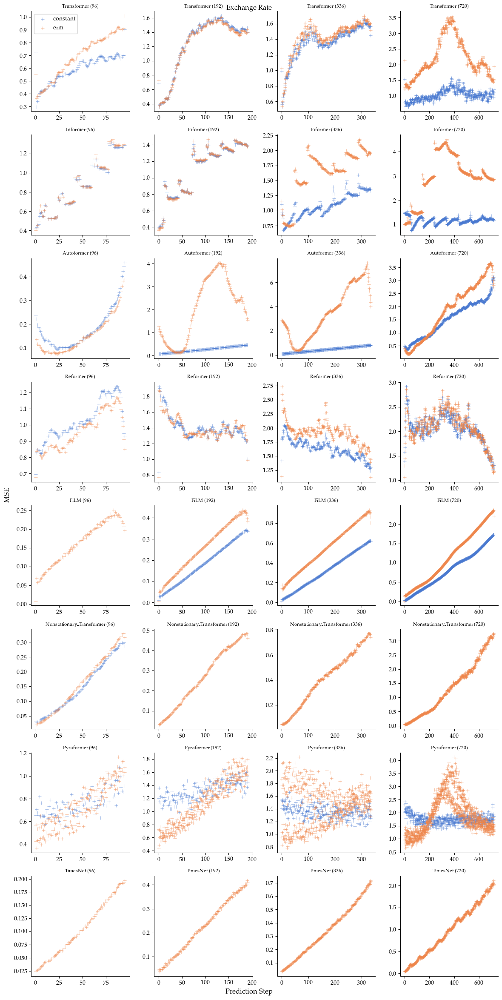

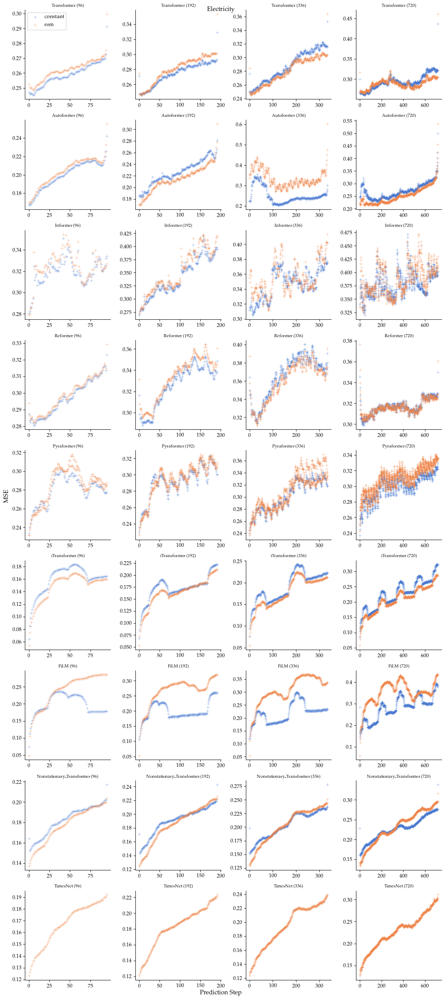

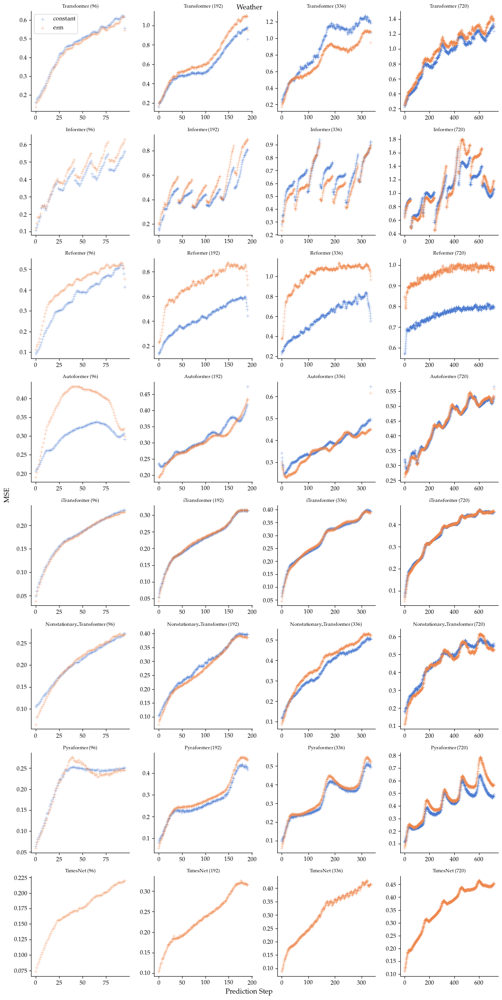

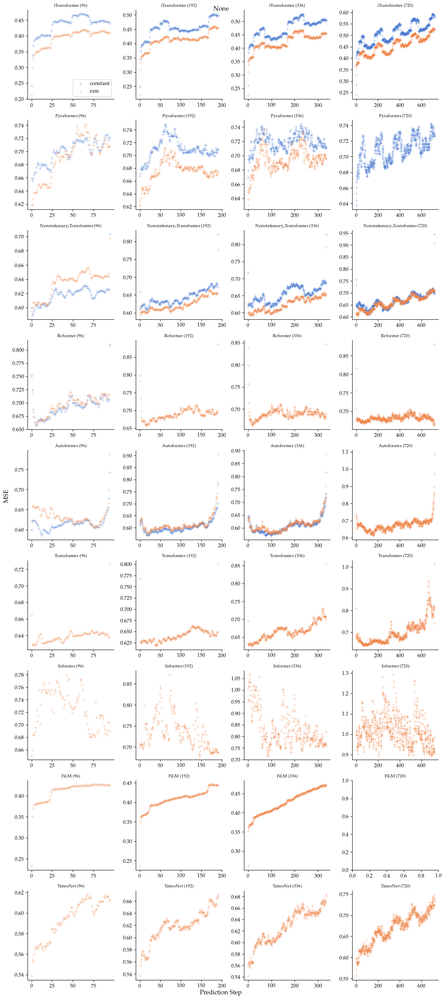

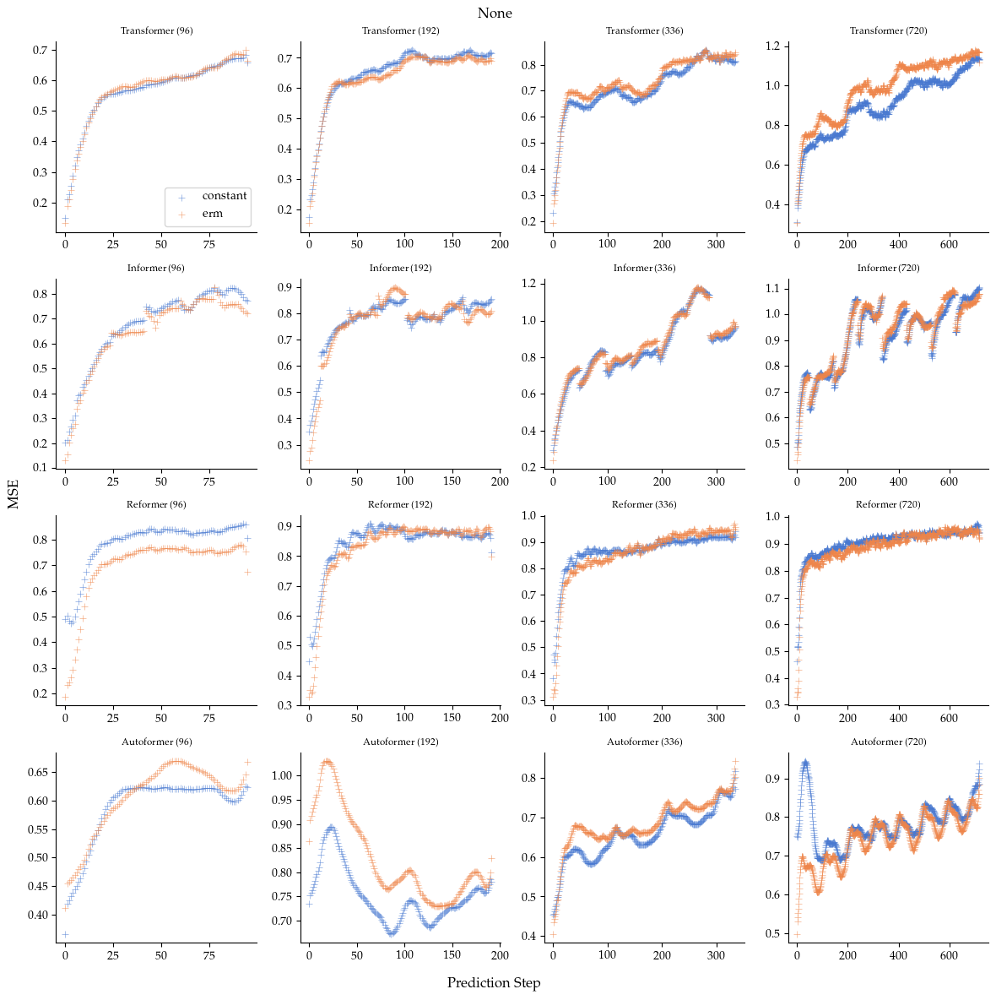

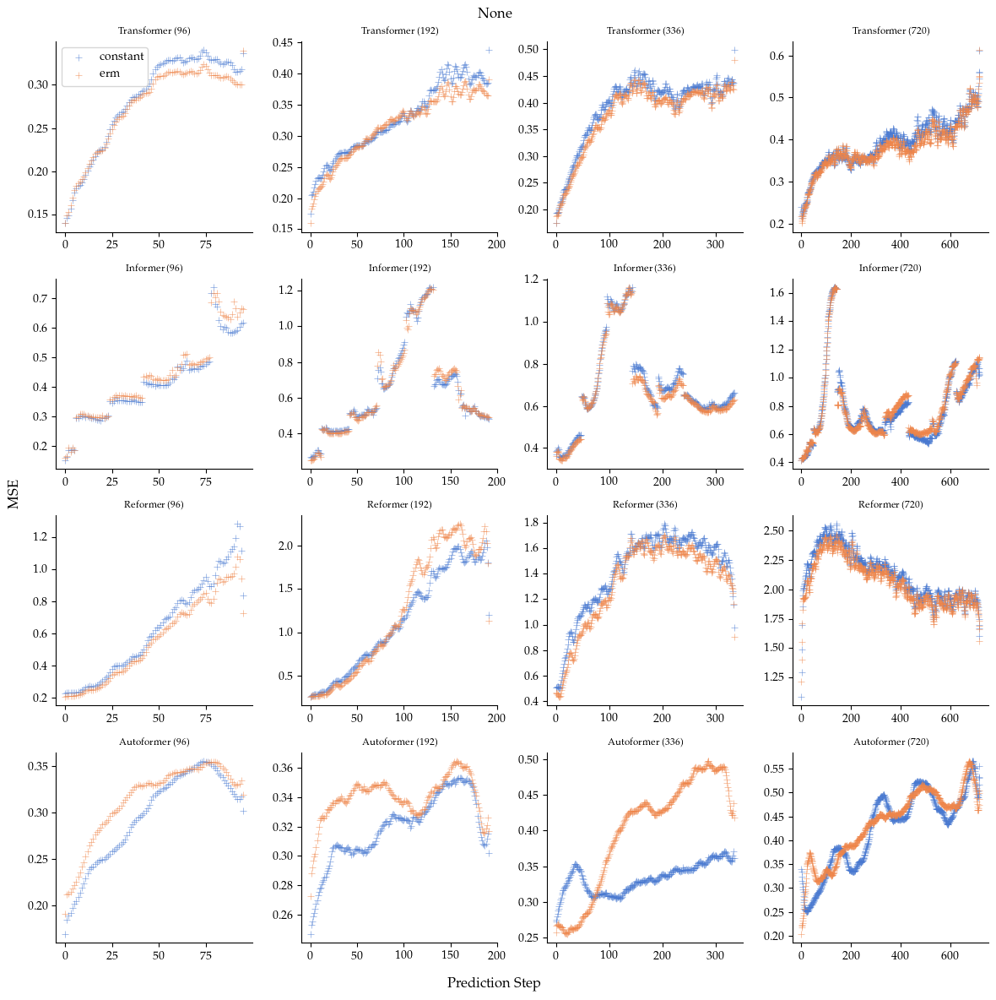

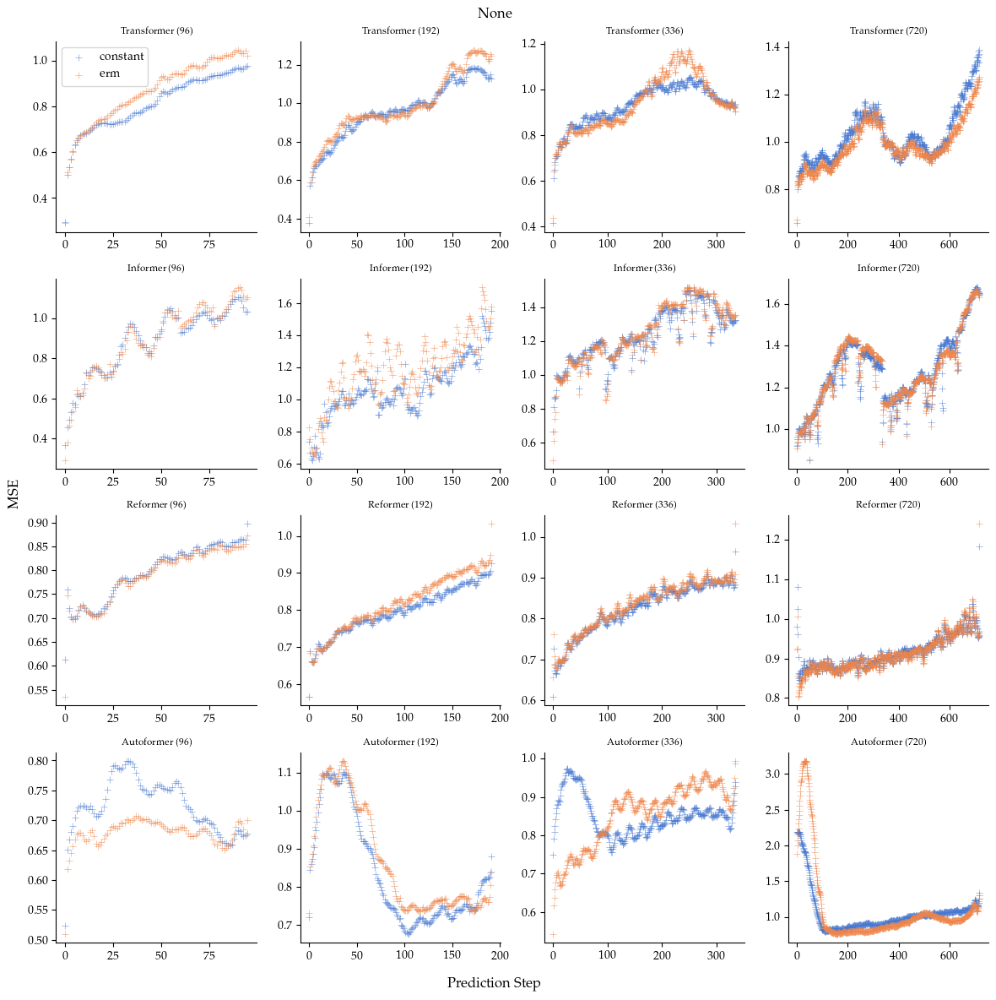

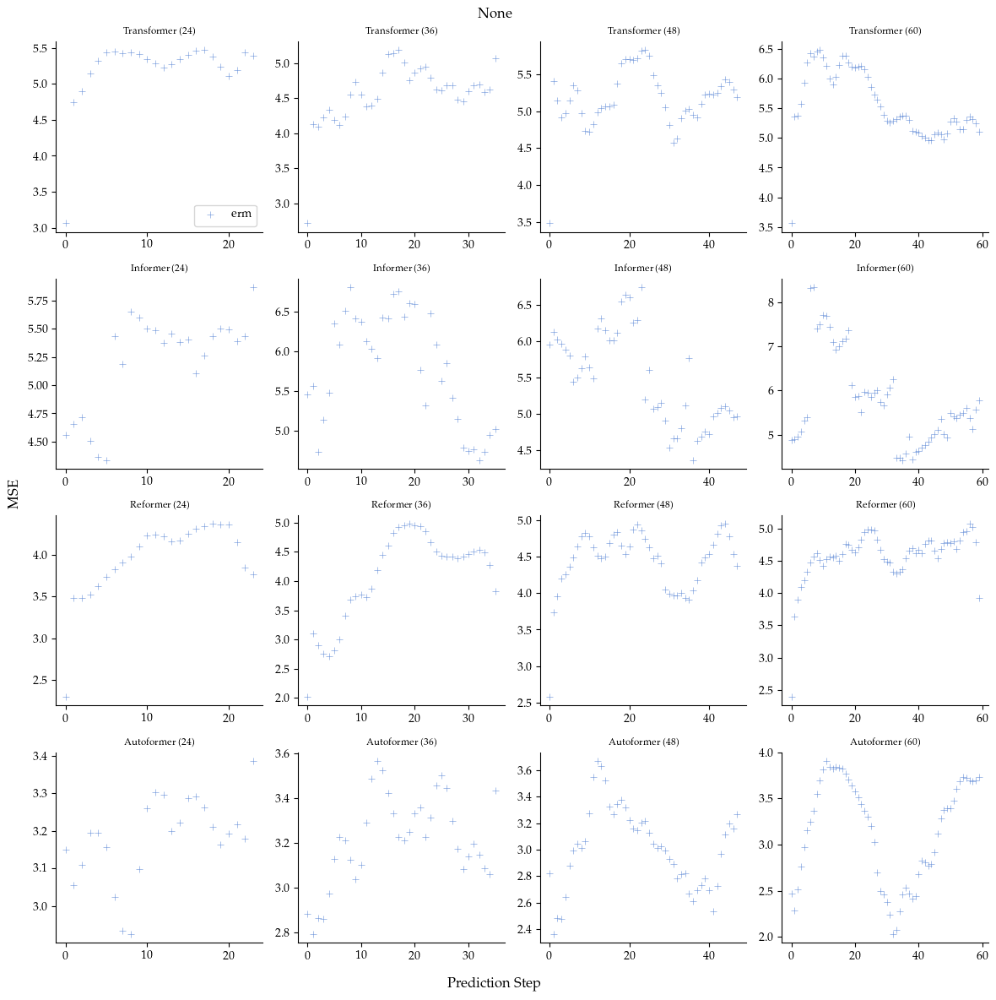

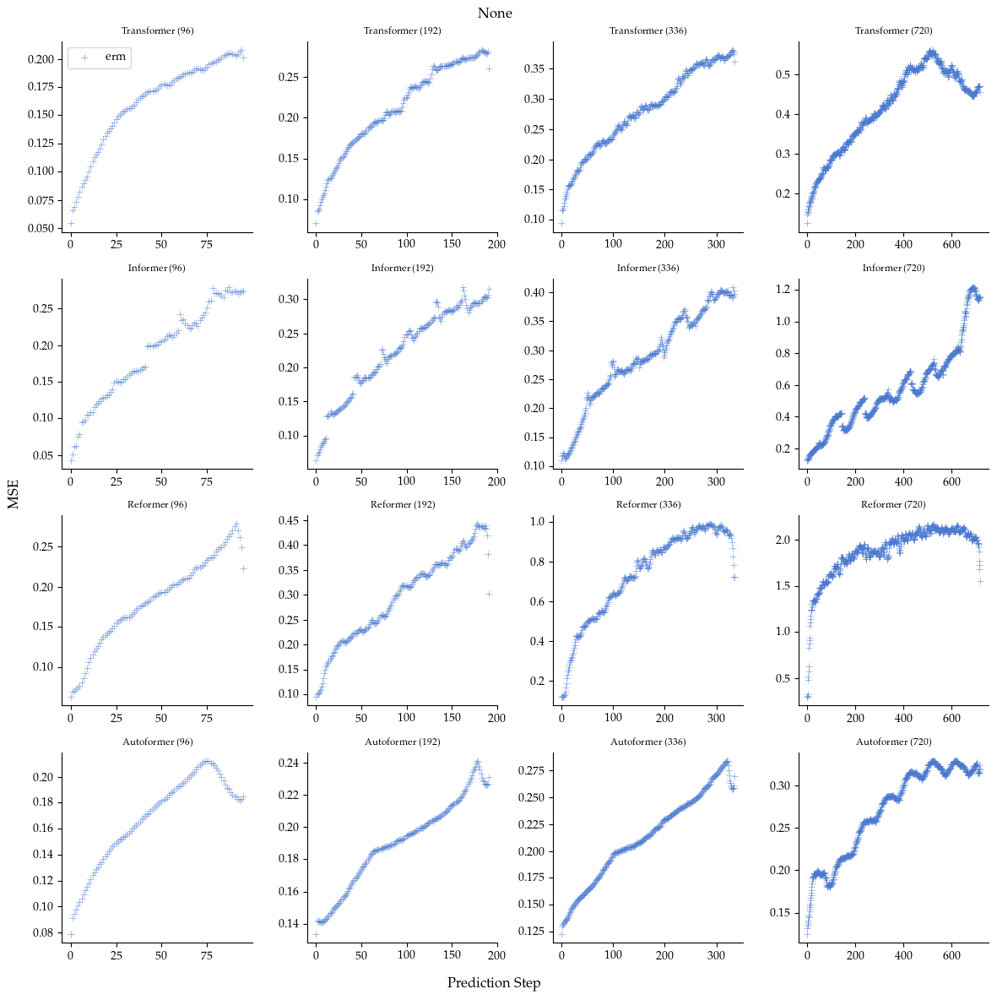

In [31]:
# PARAMS
split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
#seed=2021

sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.split==split) & (df_to_plot.constraint_type!='constant_resilience')].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def pretty_name_dataset(data_path):
    if data_path=="electricity.csv": 
        return "Electricity"
    if data_path=="weather.csv":
        return "Weather"
    if data_path=="exchange_rate.csv":
        return "Exchange Rate"

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
for data_path in df_pct50_and_erm.data_path.unique():
    # Add data for constant line
    #df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len').copy()
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    
    #df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    #display(Markdown(f"#### **ERM Vs Constrained {pred_len} (split={split})**"))

    g = sns.FacetGrid(
                    #sample_every_n(df_current_plot),
                    df_current_plot,
                    #df_current_plot,
                    row='model', 
                    col='pred_len', 
                    hue='constraint_type', 
                    height=3, 
                    aspect=1.0, 
                    legend_out=False,
                    #legend='full',
                    sharex=False,
                    sharey=False,
                    )
    #g.set_titles(row_template="", col_template="")
    
    #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
    g.map(sns.scatterplot, "step", "mse", marker='+',alpha=0.7,legend='full',edgecolor=None)
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    #name_without_extension = data_path.split(".")[0]
    #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_{name_without_extension}.pdf")
    #plt.show()

### Train vs test

In [32]:
# PARAMS
#split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.seed==seed) & (df_to_plot.split.isin(['train','test'])) & (df_to_plot.constraint_type.isin(['erm','constant']))].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]
#for model in df_to_plot.model.unique():
for data_path in df_to_plot.data_path.unique():
    for pred_len in PRED_LENS:
        # Add data for constant line
        df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len and data_path==@data_path').copy()
        mses=df_current_plot.groupby(['model','split','constraint_type'])['mse'].mean().reset_index()
        # plot only if train constant is lower than train erm and test constant is higher than test erm
        # if mses.query('split=="train"').query('constraint_type=="constant"').mse.values[0] < mses.query('split=="train"').query('constraint_type=="erm"').mse.values[0] and \
        #     mses.query('split=="test"').query('constraint_type=="constant"').mse.values[0] > mses.query('split=="test"').query('constraint_type=="erm"').mse.values[0]:
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))
    
        #constraint_level = df_current_plot.constraint_level.unique()[0]
        #df_current_plot['constraint_level'] = constraint_level
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))

        g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
        #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.add_legend()
        #TODO fix and uncomment
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
        plt.show()

#### **ERM Vs Constrained exchange_rate.csv--24**

#### **ERM Vs Constrained exchange_rate.csv--24**

ValueError: Number of rows must be a positive integer, not 0

<Figure size 0x0 with 0 Axes>

#### Train vs test select example!!!

(424, 111)
success


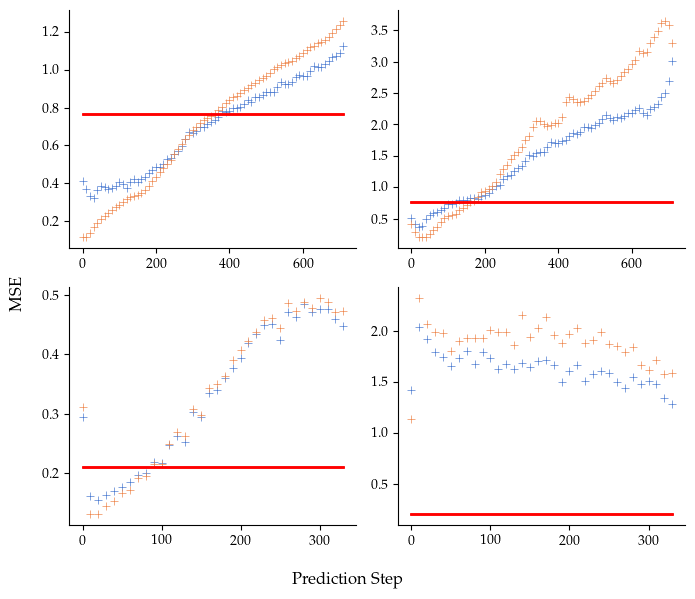

(2112, 111)
failures


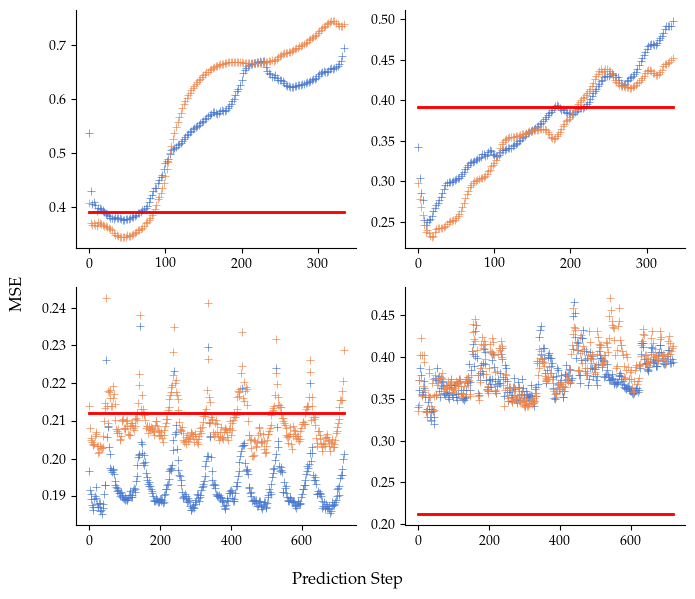

In [ ]:
import matplotlib as mpl
# Get the two success cases and two failures cases in separate dfs
# constant and erm
#**ECL192 transformer**
#**Weather 192 REformer
#Drop this one in favor of a more textbook one
#success1 = df_to_plot.query('data_path=="electricity.csv" and pred_len==192 and split!="val" and model=="Transformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success2 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==336 and split!="val" and model=="Reformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
#**Weather 332 Autoformer**
#**Electricity 720 Informer**
failure1 = df_to_plot.query('data_path=="weather.csv" and pred_len==336 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
failure2 = df_to_plot.query('data_path=="electricity.csv" and pred_len==720 and split!="val" and model=="Informer" and (constraint_type=="constant" or constraint_type=="erm")').copy()


sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# add only one x axis label
g.set_xlabels("")
g.set_ylabels("")
# set axis label at the figure level
# add the hline
# for ax in g.axes:
#     ax.axhline(y=constraint_level, color='r', linestyle='-')
g.fig.supxlabel("Prediction Step")
g.fig.supylabel("MSE")


#TODO
g.set_titles(col_template="{col_name}")


# evens = df_set1["step"]%10
# df_set1 = df_set1[evens==0]
# evens = df_set2["step"]%2
# df_set2 = df_set2[evens==0]

    
# Plot all cases
success = pd.concat([success1,success2])
failures = pd.concat([failure1,failure2])
for plot_data,figname in [
    # (success1,"success_electricity_transformer_192"),
    # (success2,"success_weather_reformer_192"),
    # (failure1,"failure_weather_autoformer_332"),
    # (failure2,"failure_electricity_informer_720")
    (success,"success"),
    (failures,"failures")
    ]:
    # print(failure1.shape)
    # print(failure2.shape)
    if plot_data.pred_len.iloc[0]>500:
        evens = plot_data["step"]%10
        plot_data = plot_data[evens==0]
    # elif plot_data.pred_len.iloc[0]==336:
    #     evens = plot_data["step"]%4
    #     plot_data = plot_data[evens==0]
    else: 
        evens = plot_data["step"]%2
        plot_data = plot_data[evens==0]
    print(plot_data.shape)
    print(figname)
    g = sns.FacetGrid(plot_data, row="model",col='split', hue='constraint_type', height=3, aspect=1.0, legend_out=True,sharex=False,sharey=False)
    g.map(sns.scatterplot, "step", "mse", legend='full', marker='+')
    g.map(sns.lineplot, "step", "constraint_level", legend='full',color='red')
    
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(col_template="{col_name}")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    for ax in g.axes.flat:
        ax.set_title("", fontsize='large')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    g._legend.remove()
    # tight layout
    g.fig.tight_layout()
    #g.savefig(f"../figures/icml/{figname}.pdf")
    plt.show()

# g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
# #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
# g.map(sns.scatterplot, "step", "mse", alpha=.7)
# g.add_legend()
# #TODO fix and uncomment
# #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
# plt.show()

### Multipliers over the window

#### **Multipliers vs loss 96 (split=train, constraint_idx=2)**

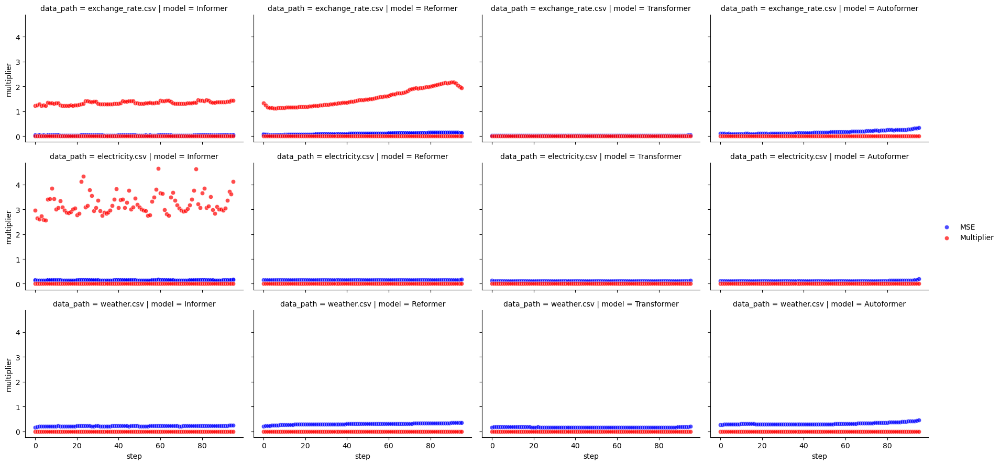

#### **Multipliers vs loss 192 (split=train, constraint_idx=2)**

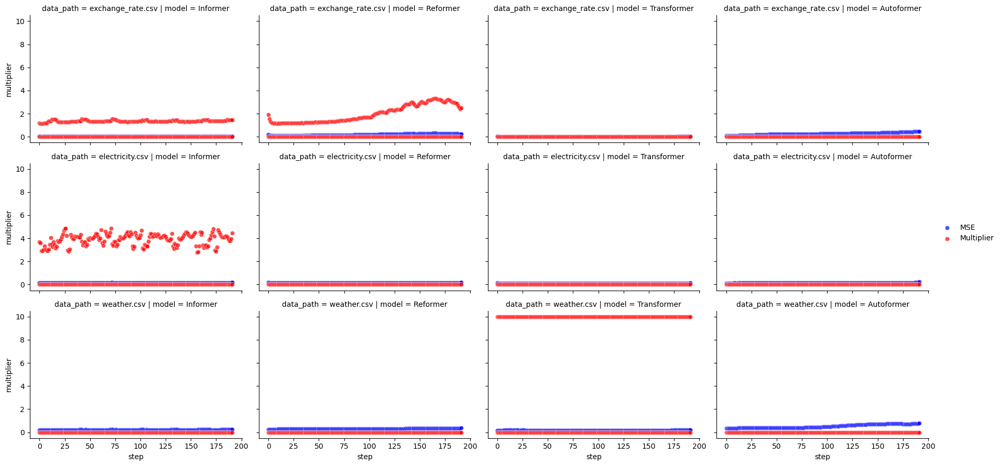

#### **Multipliers vs loss 336 (split=train, constraint_idx=2)**

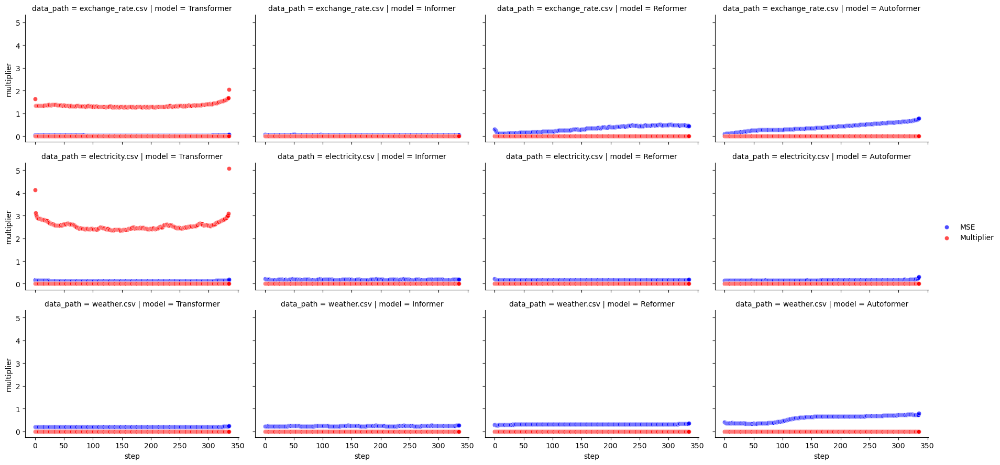

#### **Multipliers vs loss 720 (split=train, constraint_idx=2)**

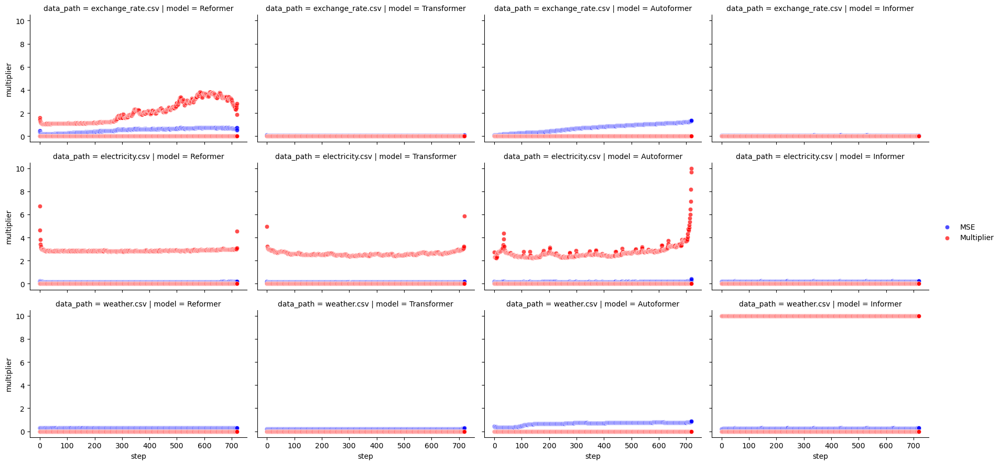

In [ ]:
# PARAMS
split="train"
constraint_idx = 2 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50 = df_to_plot[
    (df_to_plot.constraint_idx.isin([0,constraint_idx])) 
    & (df_to_plot.seed==seed) & (df_to_plot.split==split)
    & (df_to_plot.constraint_type=="constant")
    ].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[96]
for pred_len in PRED_LENS:
    # Add data for constant line
    df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

    g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
    # Plot multipliers and MSEs
    g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
    g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
    # Add legend the series

    g.add_legend()
    #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
    plt.show()

### Does shape prevail when extending window length

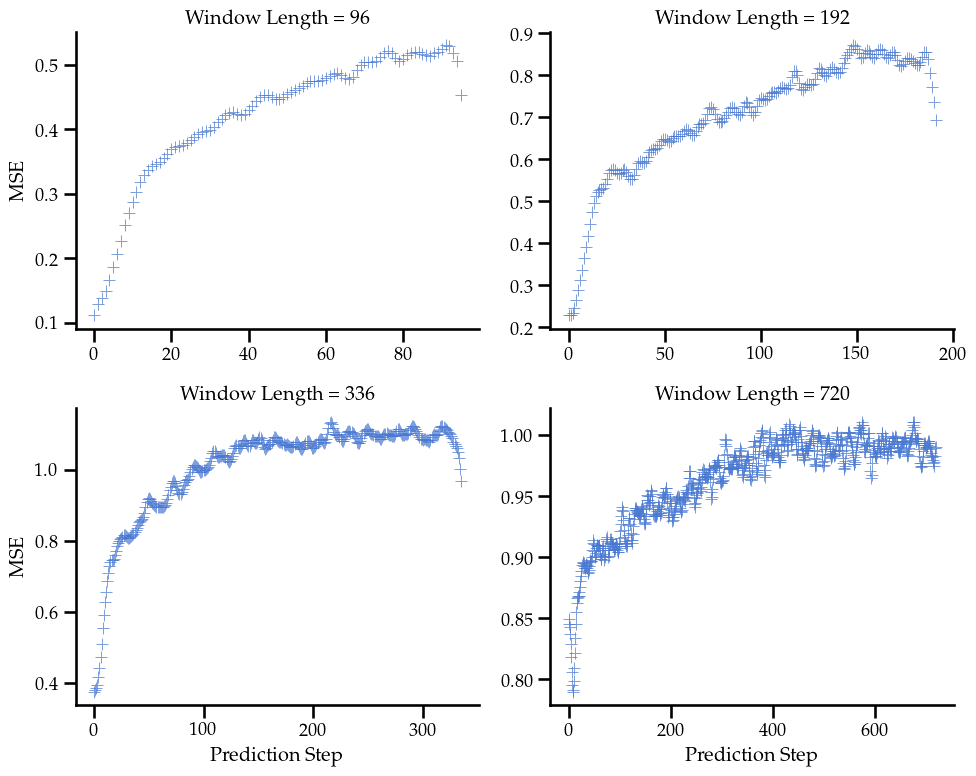

In [197]:
model="Reformer"
data_path="weather.csv"
pred_len=720
split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
#to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
# for model in df_to_plot.model.unique():
#     for data_path in df_to_plot.data_path.unique():
#         #for pred_len in df_to_plot.pred_len.unique():
#         to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
#         #to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#         to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#         #display(to_plot.constraint_level)
#         # g = sns.scatterplot(data=to_plot,
#         #                     x="Prediction Step",
#         #                     y= "MSE",
#         #                     alpha=.7,hue='constraint_type',style='constraint_type',
#         #                     #palette={'ERM':'blue','Constrained':'red'},
#         #                     legend='full'
#         #                     )
#         display(Markdown(f"# {model} on {data_path} (pred_len={pred_len}, split={split})"))
#         g=sns.FacetGrid(to_plot, col="Window Length", col_wrap=2, height=4, aspect=1.5,sharex=False,sharey=False).map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         #g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#         plt.figure(figsize=(3.5, 2.6))
#         plt.show()
to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & type=="ERM"').copy()
#display(to_plot.run_id.nunique())
#to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

# to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#display(to_plot.constraint_level)
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE",
#                     alpha=.9,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full'
#                     )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#g.set_title("")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

#plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')  # For a PGF file

# Another option
to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
g=sns.FacetGrid(to_plot, 
                col="Window Length", 
                col_wrap=2, 
                height=4, 
                aspect=1.25,
                sharex=False,
                sharey=False
                )
g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7,marker='+')
plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE", 
#                     alpha=.7,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full')

plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### Is train correlated with test?

<AxesSubplot:xlabel='mse_train', ylabel='mse_test'>

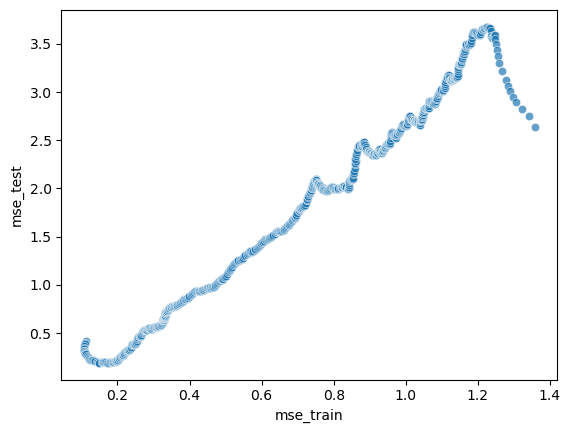

In [ ]:
model="Autoformer"
data_path="exchange_rate.csv"
pred_len=720

dd=df_to_plot.query('model==@model & data_path==@data_path & type=="ERM" & pred_len==@pred_len')
# Create a dataset of mse train and mse test for each step with dd using melt
dd_train = dd.query('split=="train"').copy()
dd_test = dd.query('split=="test"').copy()

dd_plot=dd_train.merge(dd_test,on="step",suffixes=('_train','_test'))[['step','mse_train','mse_test']]
#dd2['diff'] = dd2.test-dd2.train

sns.scatterplot(dd_plot, x="mse_train", y="mse_test", alpha=.7,)

### PAPER: Singular ERM vs Constrained 
Of ERM vs constrained

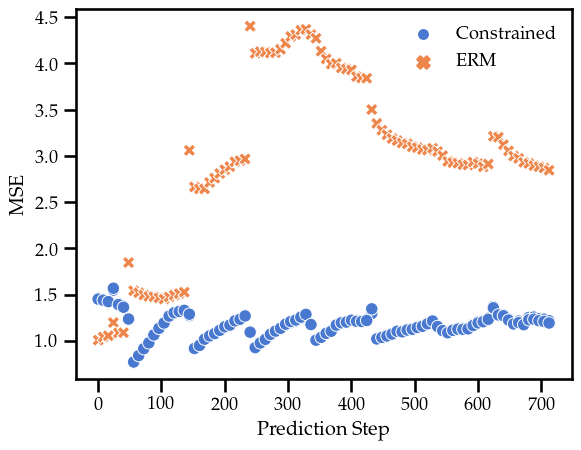

In [ ]:
# #Option 1
# model="Autoformer"
# data_path="exchange_rate.csv"
# pred_len=336
# split='test'

# # Option 2
# model="Transformer"
# data_path="exchange_rate.csv"
# pred_len=720
# split='test'

# # Option 3
model="Informer"
data_path="exchange_rate.csv"
pred_len=720
split='test'

# # Option 4
# model="Autoformer"
# data_path="weather.csv"
# pred_len=96
# split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
#sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})

#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
to_plot = df_to_plot.query('model==@model & data_path==@data_path & pred_len==@pred_len & split==@split').copy()
to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#Sample every other datapoint
to_plot = to_plot[to_plot.step%8==0]

to_plot.rename(columns={'mse':'MSE','step': "Prediction Step"},inplace=True)
#display(to_plot.constraint_level)
g = sns.scatterplot(data=to_plot,
                    x="Prediction Step",
                    y= "MSE", 
                    hue='type',
                    style='type',
                    #marker='+',
                    #palette={'ERM':'blue','Constrained':'red'},
                    legend='full'
                    )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

# remove borders from legend
g.get_legend().get_frame().set_linewidth(0.0)
g.get_legend().set_title("")

# Set the size of the markers
g.legend_.legendHandles[0]._sizes = [40]

# make legend marker a + instead of a dot using handlers manually
#g.legend(handles=g.legend_.legendHandles, labels=["ERM", "Constrained"], title="Type", loc="upper left")



#g.set_xlabels("")
#g.set_ylabels("")
#g.set_titles(col_template="{col_name}")
#g.fig.supxlabel("Prediction Step")
#g.fig.supylabel("MSE")
# for ax in g.axes.flat:
#     ax.set_title("", fontsize='large')
#     ax.set_xlabel(ax.get_xlabel(), fontsize='large')
#     ax.set_ylabel(ax.get_ylabel(), fontsize='large')

# make markers bigger
# for ax in g.axes.flat:
#     for p in ax.patches:
#         p.set( markersize=20)
# disable legend
#g._legend.remove()
# tight layout
#g.tight_layout()
#g.savefig(f"../figures/icml/{figname}.pdf")


plt.savefig(f'../figures/icml/erm_vs_constrained_fp_{model}_{data_path[:4]}_{pred_len}.pdf', bbox_inches='tight')  # For a PGF file
#plt.show()
plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### PAPER: ERM vs Constrained across models on two datasets

Saved to ../figures/icml/constrained_vs_erm_allmodels_exch_720.pdf
Saved to ../figures/icml/constrained_vs_erm_allmodels_weather_96.pdf


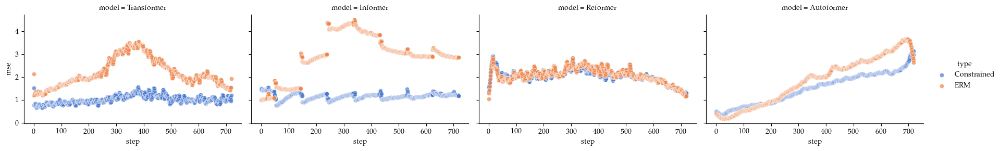

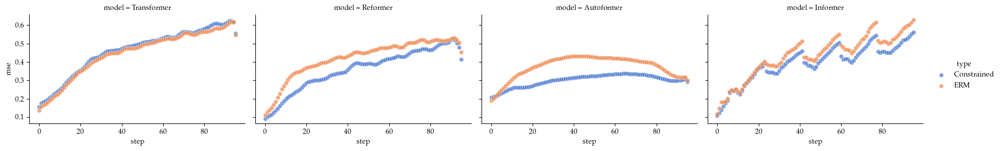

In [ ]:
df_set1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_set2 = df_to_plot.query('data_path=="weather.csv" and pred_len==96 and split=="test"').copy()

#Params for latex
backup = plt.rcParams
sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
}
)

#plot 1
g=sns.FacetGrid(df_set1, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7,legend='full')
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_exch_720.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#plot 2
g=sns.FacetGrid(df_set2, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7)
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_weather_96.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#restoring parameters
plt.rcParams.update(backup)

### (old) ERM vs constrained

[3 2 1 0]


### Dataset: electricity.csv pred_len: 96 constraint_idx: 3

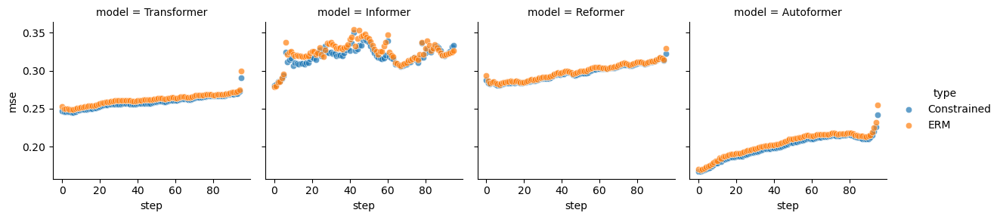

### Dataset: electricity.csv pred_len: 96 constraint_idx: 2

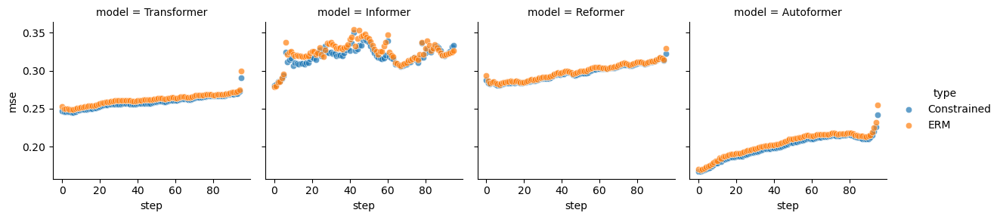

### Dataset: electricity.csv pred_len: 96 constraint_idx: 1

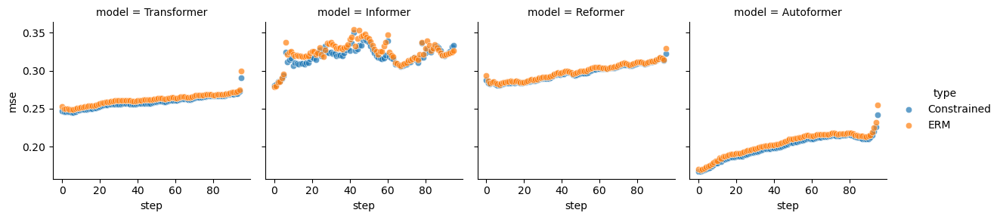

### Dataset: electricity.csv pred_len: 96 constraint_idx: 0

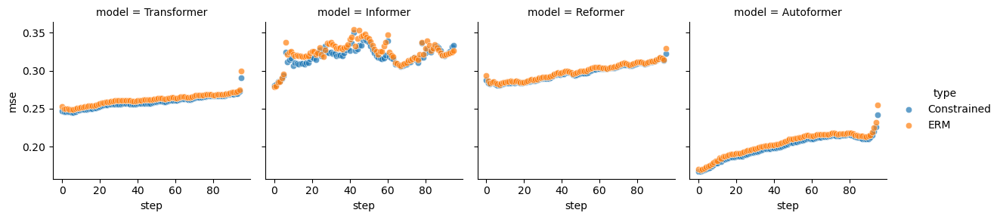

[5 6 2 1 0]


### Dataset: electricity.csv pred_len: 192 constraint_idx: 5

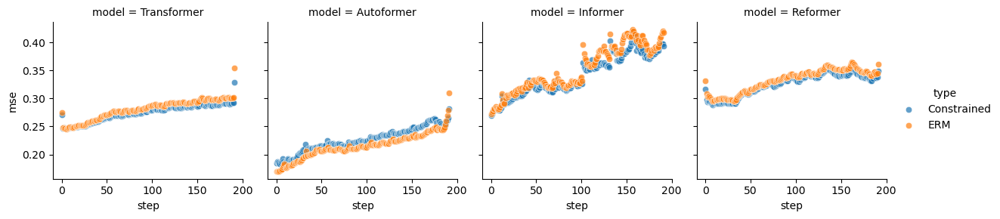

### Dataset: electricity.csv pred_len: 192 constraint_idx: 6

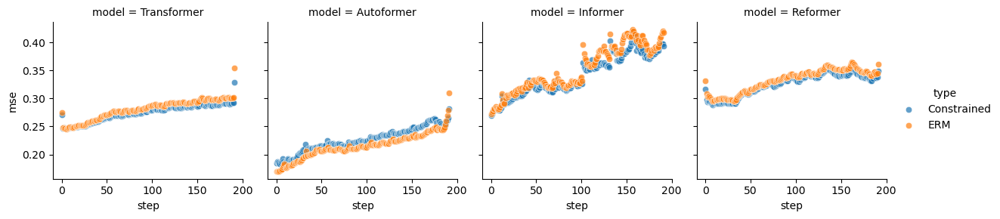

### Dataset: electricity.csv pred_len: 192 constraint_idx: 2

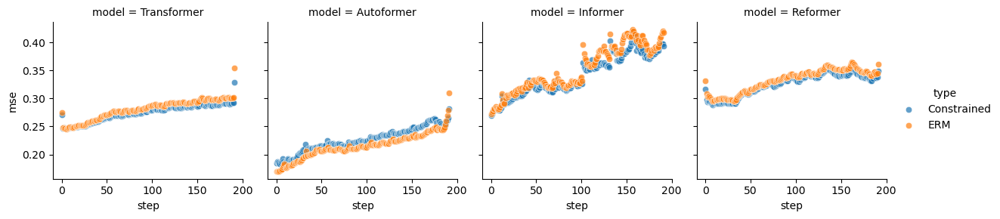

### Dataset: electricity.csv pred_len: 192 constraint_idx: 1

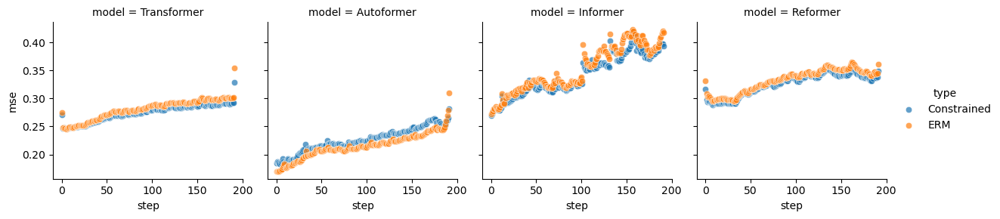

### Dataset: electricity.csv pred_len: 192 constraint_idx: 0

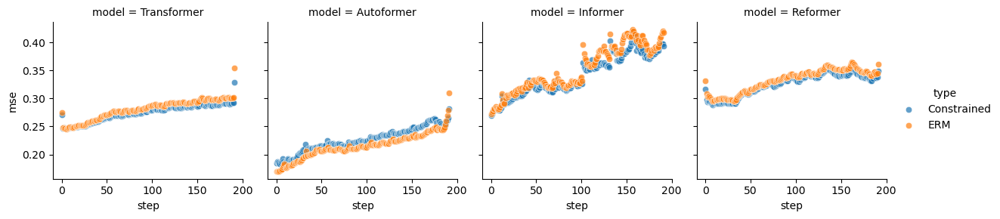

[5 2 3 0]


### Dataset: electricity.csv pred_len: 336 constraint_idx: 5

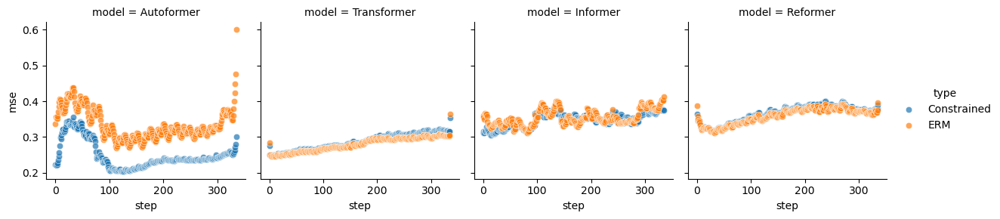

### Dataset: electricity.csv pred_len: 336 constraint_idx: 2

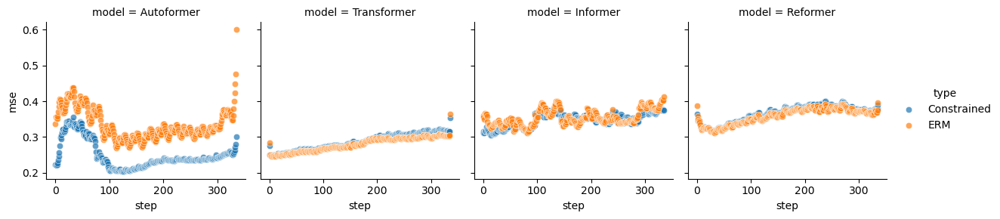

### Dataset: electricity.csv pred_len: 336 constraint_idx: 3

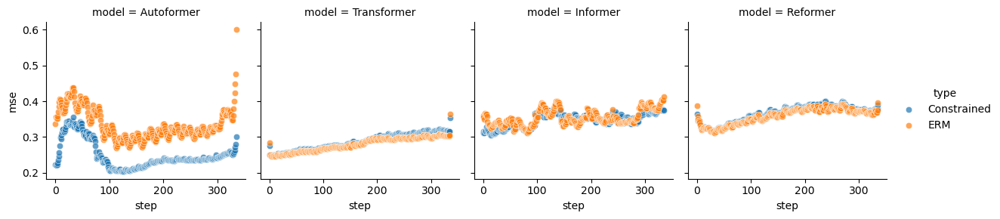

### Dataset: electricity.csv pred_len: 336 constraint_idx: 0

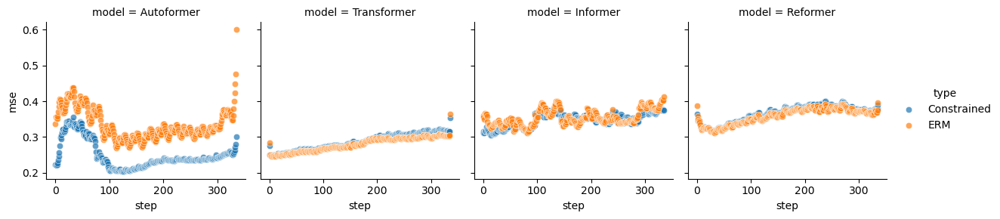

[2 3 0]


### Dataset: electricity.csv pred_len: 720 constraint_idx: 2

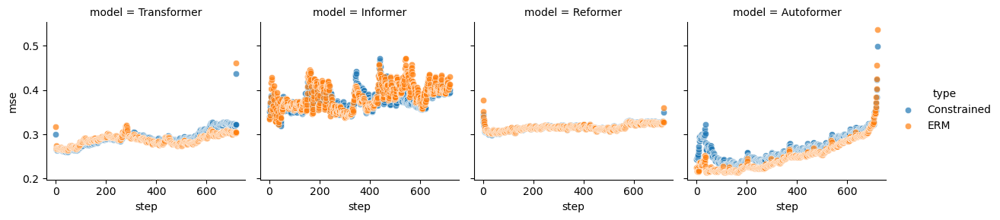

### Dataset: electricity.csv pred_len: 720 constraint_idx: 3

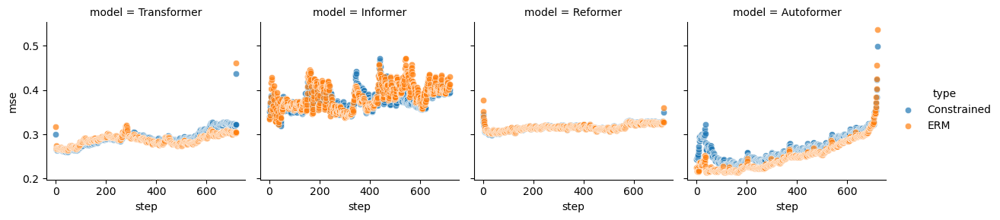

### Dataset: electricity.csv pred_len: 720 constraint_idx: 0

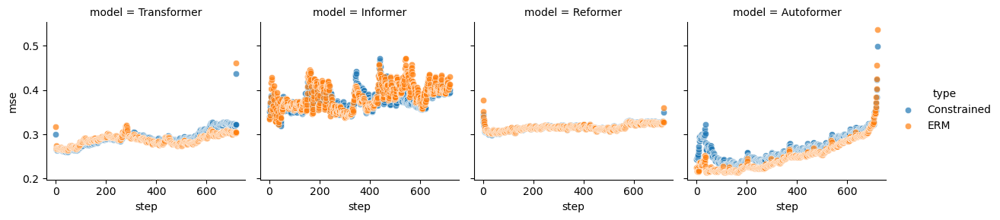

[6 2 4 0]


### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 6

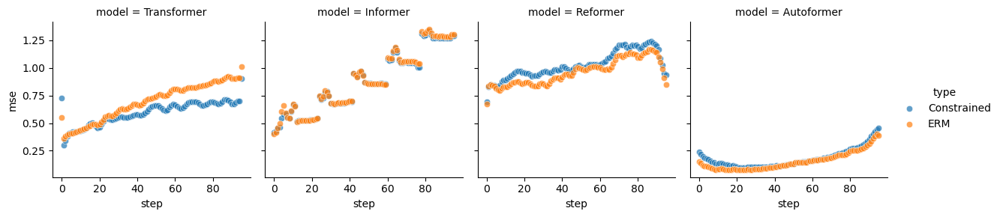

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 2

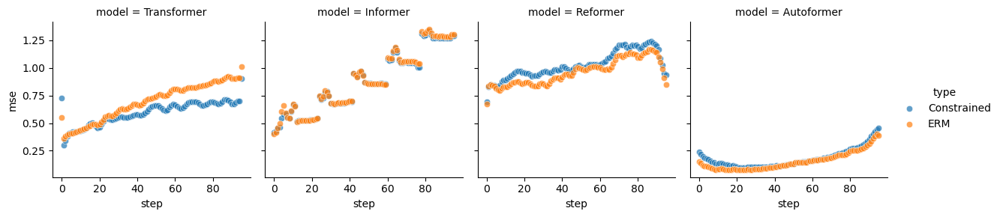

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 4

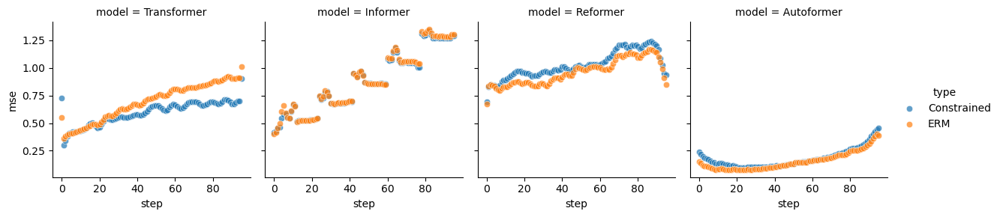

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 0

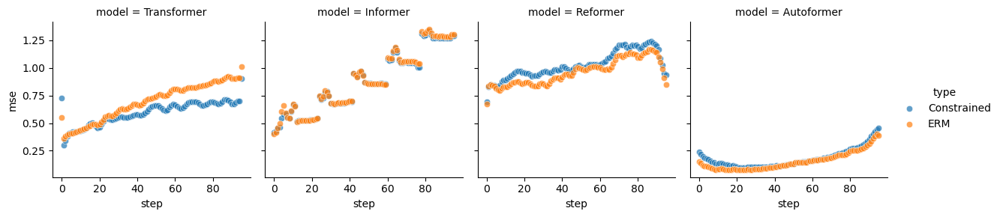

[6 3 2 0]


### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 6

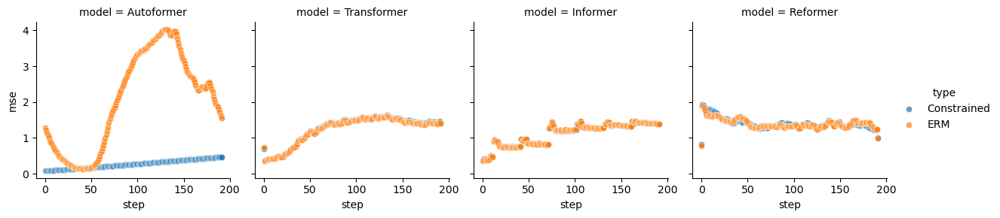

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 3

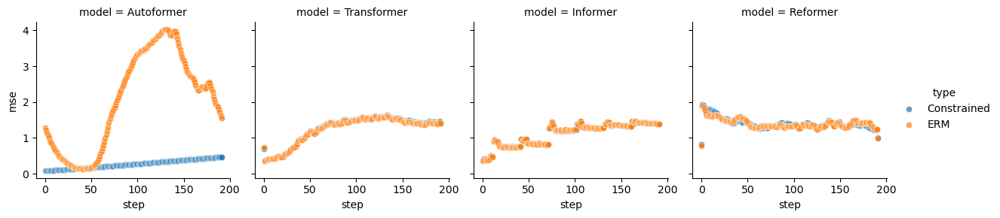

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 2

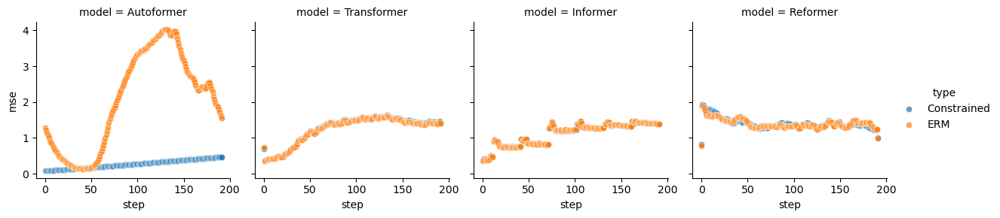

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 0

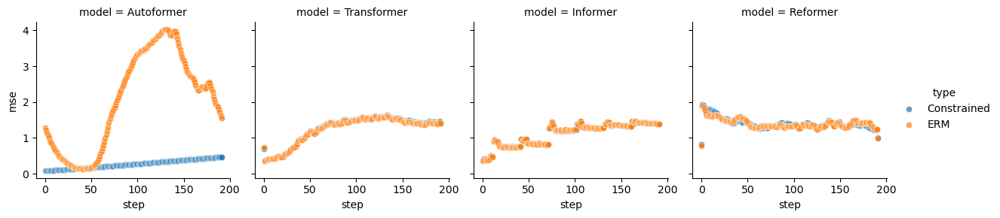

[6 2 1 0]


### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 6

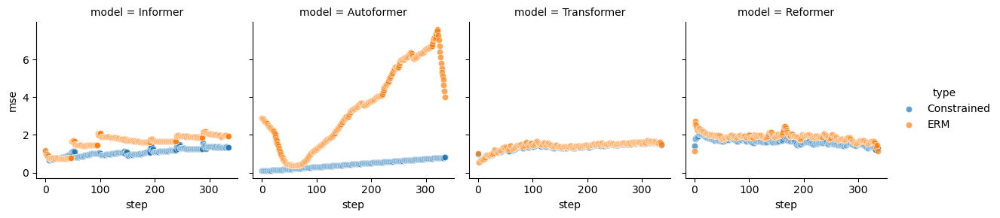

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 2

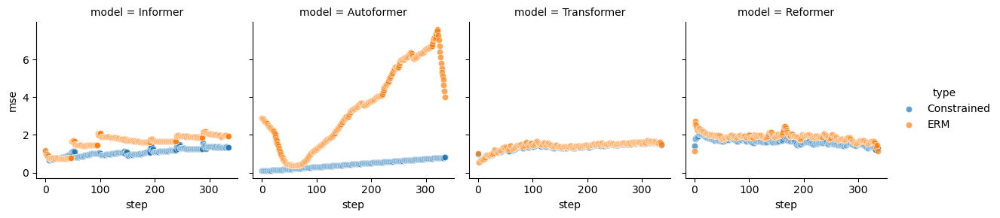

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 1

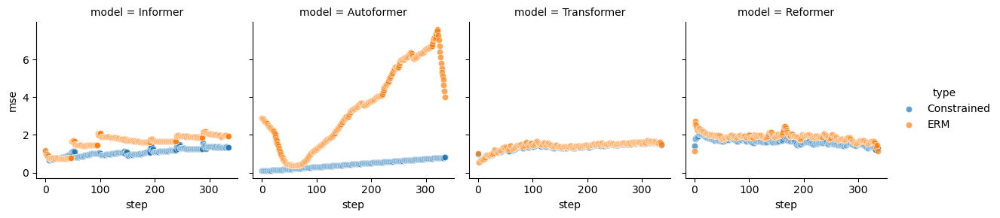

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 0

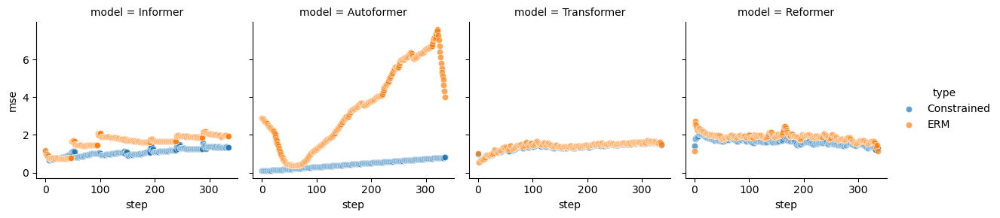

[5 2 3 0]


### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 5

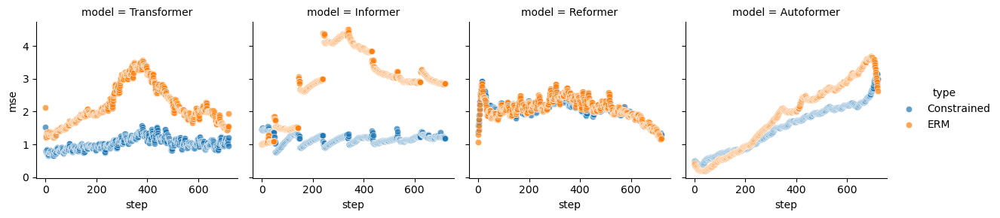

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 2

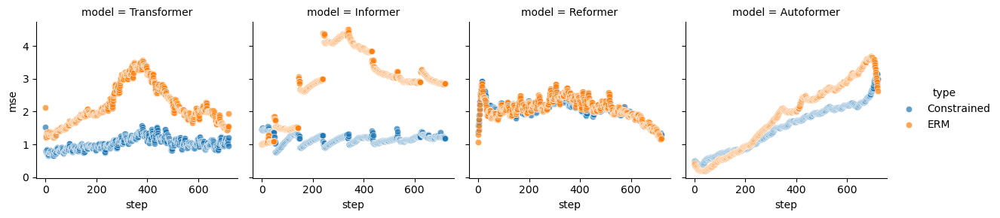

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 3

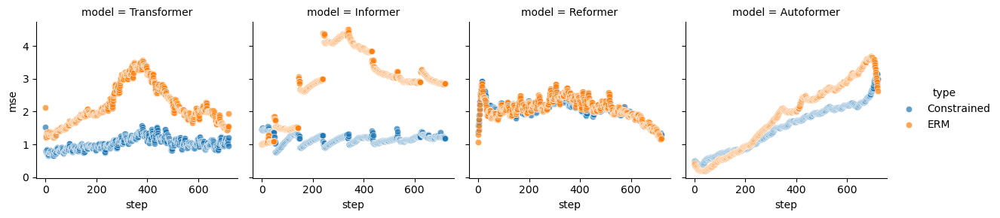

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 0

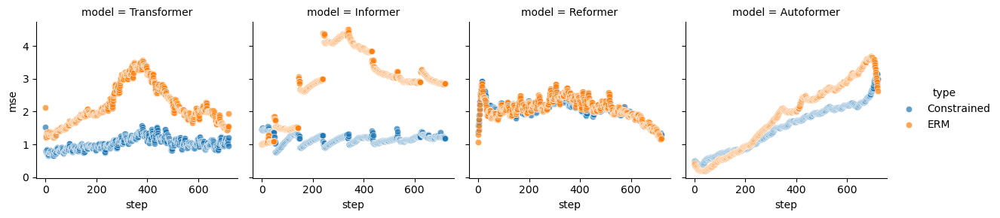

[4 6 1 0]


### Dataset: weather.csv pred_len: 96 constraint_idx: 4

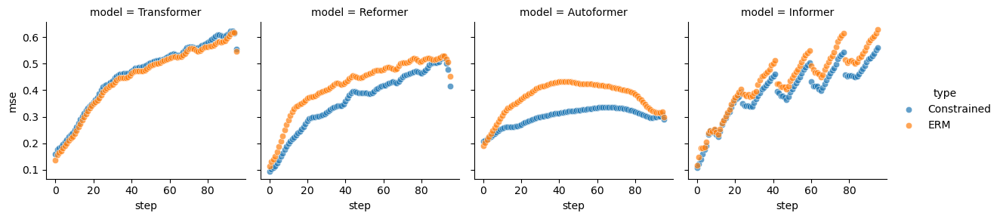

### Dataset: weather.csv pred_len: 96 constraint_idx: 6

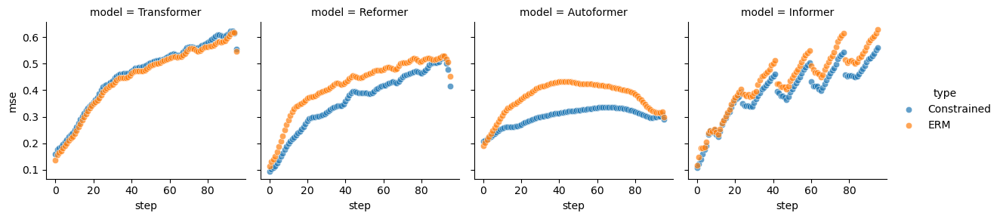

### Dataset: weather.csv pred_len: 96 constraint_idx: 1

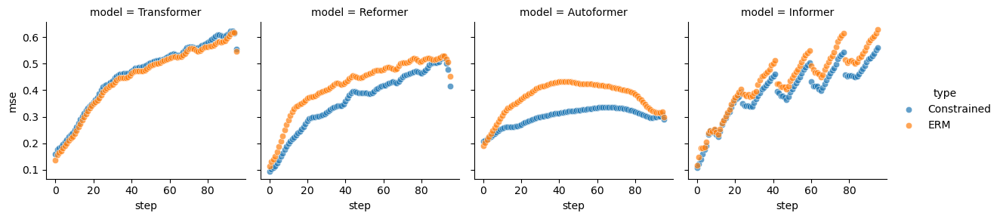

### Dataset: weather.csv pred_len: 96 constraint_idx: 0

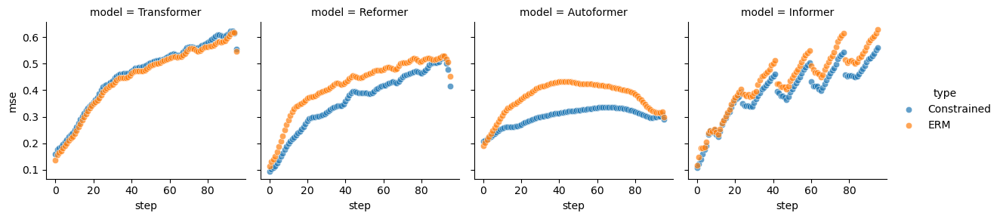

[5 4 2 1 0]


### Dataset: weather.csv pred_len: 192 constraint_idx: 5

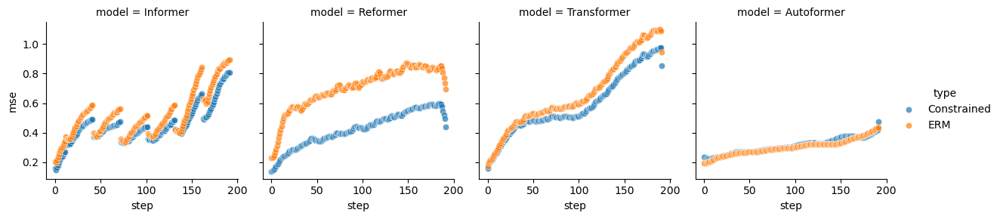

### Dataset: weather.csv pred_len: 192 constraint_idx: 4

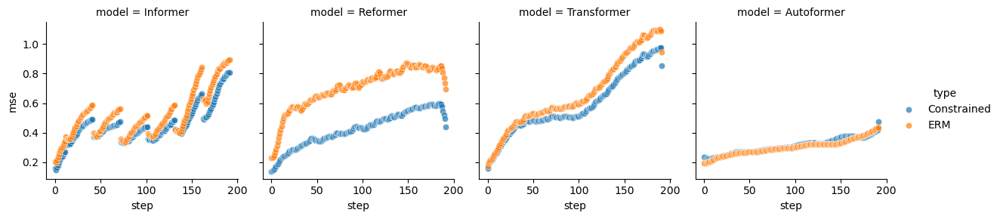

### Dataset: weather.csv pred_len: 192 constraint_idx: 2

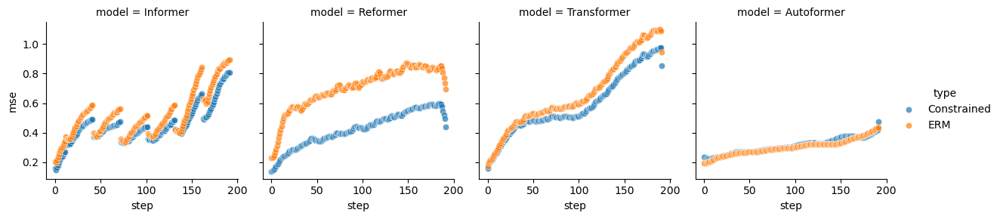

### Dataset: weather.csv pred_len: 192 constraint_idx: 1

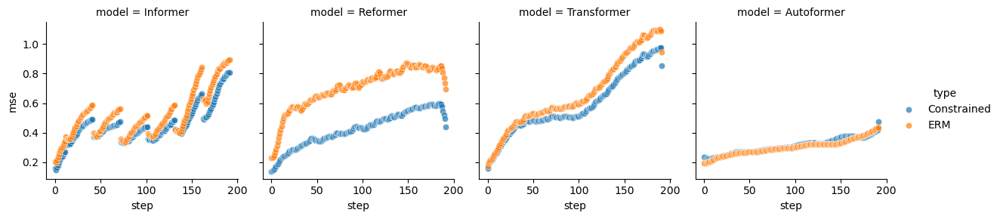

### Dataset: weather.csv pred_len: 192 constraint_idx: 0

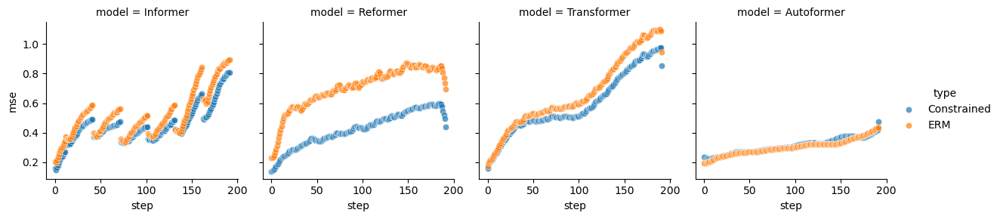

[5 4 3 1 0]


### Dataset: weather.csv pred_len: 336 constraint_idx: 5

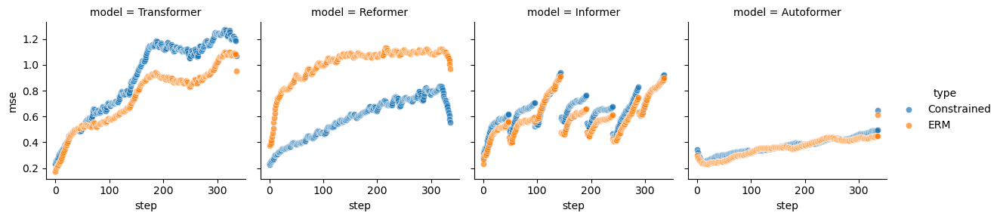

### Dataset: weather.csv pred_len: 336 constraint_idx: 4

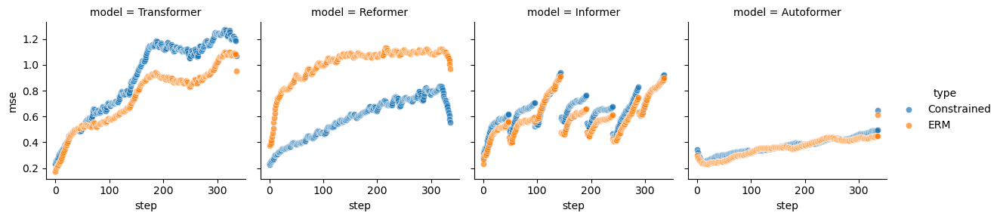

### Dataset: weather.csv pred_len: 336 constraint_idx: 3

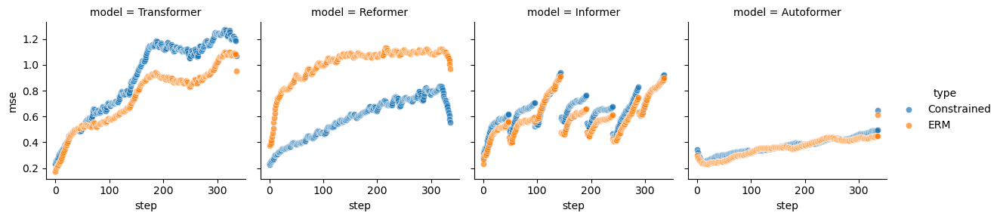

### Dataset: weather.csv pred_len: 336 constraint_idx: 1

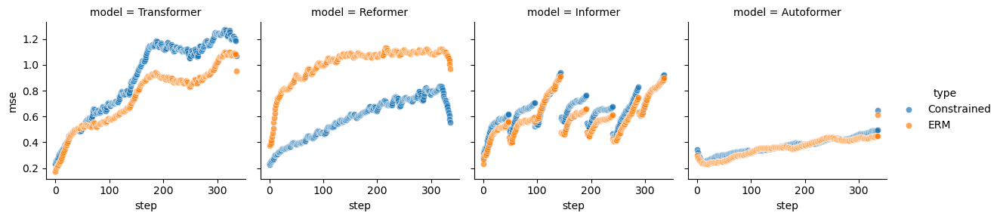

### Dataset: weather.csv pred_len: 336 constraint_idx: 0

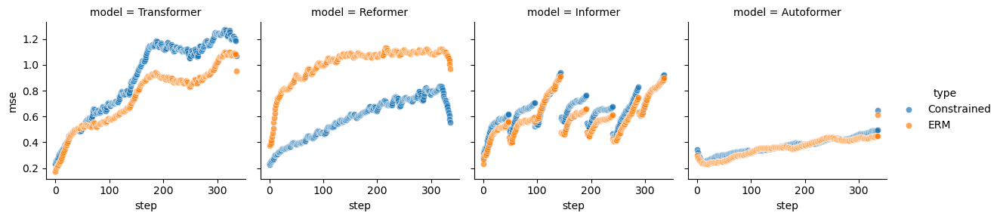

[3 2 1 0]


### Dataset: weather.csv pred_len: 720 constraint_idx: 3

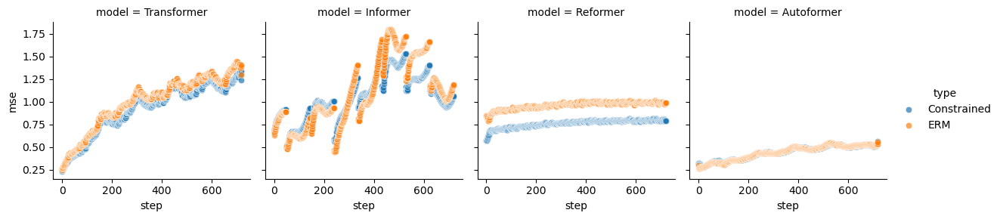

### Dataset: weather.csv pred_len: 720 constraint_idx: 2

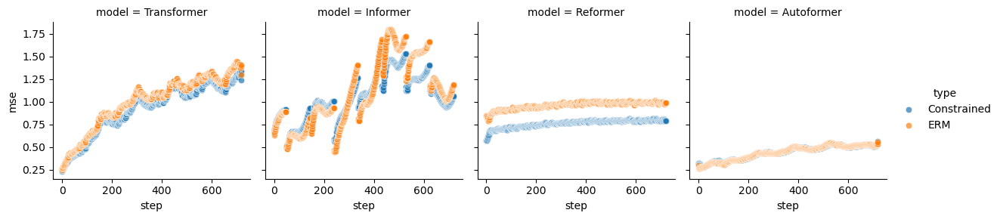

### Dataset: weather.csv pred_len: 720 constraint_idx: 1

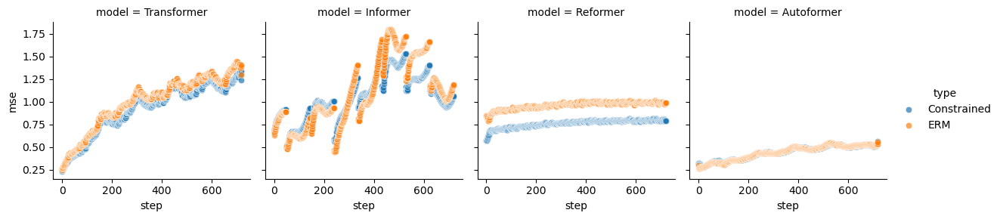

### Dataset: weather.csv pred_len: 720 constraint_idx: 0

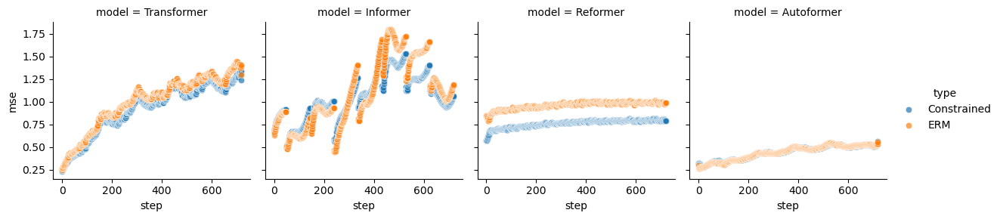

In [ ]:
from IPython.display import display, Markdown
to_plot = df_to_plot[(df_to_plot.split=='test')].copy()
for (data_path,pred_len), series in to_plot.groupby(['data_path',"pred_len"]):
    constraints = series.constraint_idx.unique()
    print(constraints)
    constraints = constraints[constraints!=-1] # to iterate over all constraints explored.
    for constraint_idx in constraints:
        display(Markdown(f"### Dataset: {data_path} pred_len: {pred_len} constraint_idx: {constraint_idx}"))
        plot_series = series#series[series["constraint_idx"]==constraint_idx]
        
        #means_per_experiment = plot_series.groupby(['pred_len','constraint_level','Algorithm','model','epoch','type'])['mse'].mean().reset_index()
        #display(means_per_experiment)
        # do a pivot where model are the rows, and the columns constrained and unconstrained
        #display(means_per_experiment.pivot(index=['model'], columns='type', values='mse').reset_index())

        # sns.scatterplot(x="step", y="mse", hue="Algorithm",style="split", data=plot_series)
        
        # plt.axhline(y=constraint_level, color='r', linestyle='-')
        # plt.title(f"Pred Length: {pred_len}, Constraint_level: {constraint_level}")
        # plt.show()

        # This same scatterplot but in a grid by algorithm. 
        g = sns.FacetGrid(plot_series, col="model", hue="type")
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.add_legend()
        # add the hline
        # for ax in g.axes:
        #     ax.axhline(y=constraint_level, color='r', linestyle='-')
        plt.show()
        # export this plot to latex. Remove the dot in constraint_level decimal
        #TODO fix
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{data_path.replace('.','')}_{pred_len}_{str(constraint_level).replace('.','')}.png")
        # Fix [Errno 2] No such file or directory: 'figures/electricity.csv_96_0.17_individual.png'


### ERM on multiple algorithms
As a front page chart to illustrate the problem

In [ ]:
#TODO ( I think Nacho already did this)

### Loss shaping single instance qualitative analysis

### Plotting dual variables

In [ ]:
df_to_plot[['run_id','pred_len','constraint_level','data_path','model','type']].drop_duplicates().query("data_path=='weather.csv' and model=='Reformer' and type=='Constrained'")

,run_id,pred_len,constraint_level,data_path,model,type
131904,ja5qqrwj,336,0.730,weather.csv,Reformer,Constrained
134064,dv2s5qjf,192,0.598,weather.csv,Reformer,Constrained
134928,dpn9jz5a,96,0.527,weather.csv,Reformer,Constrained
258768,dthgwiaz,720,0.283,weather.csv,Reformer,Constrained


In [ ]:
# #df_to_plot.query('split=="train" and pred_len==96').run_id.head(1)
# #mult_cols = [f"multiplier/{i}" for i in range(0,96)]
# # Plot for every constraint level in the 96 pred len window
# #for pred_len in df_to_plot.pred_len.unique():
# display(Markdown(f"# Multipliers for window of {pred_len}"))
# # sns.scatterplot(x="step", y="multiplier", hue="model",style="constraint_level", 
# #     data=df_to_plot.query(f"split=='train' and type=='Constrained' and pred_len=={96} and data_path=='weather.csv'"))
# # same plot, but grid with one plot per model
# dd = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='train'")#.query(f"split=='train' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")
# dd_test = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='test'")#.query(f"split=='test' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")

# #print(dd_test.constraint_level.unique())
# test_set_plus_multipliers = dd[['step','multiplier']].merge(dd_test[['step','split','mse']],on='step')

# unioned = pd.concat([dd[['step','split','multiplier','mse']],test_set_plus_multipliers[['step','split','multiplier','mse']]])

# display(unioned)


# display(test_set_plus_multipliers)

# #constraint_level==0.553
# # mult on x, mse@train and mse@test on y. hue=split
# # Add step over every point
# sns.scatterplot(unioned,x="multiplier", y="mse",hue='split', alpha=.3,legend='full')



# g = sns.FacetGrid(dd, col="model", row="constraint_level")
# g.map(sns.scatterplot, "step", "multiplier", alpha=.3)
# #g.map(sns.scatterplot, "step", "mse", alpha=.3)

# Multipliers for window of 720

,step,split,multiplier,mse
16128,0,train,2.801533,0.209369
16129,1,train,1.050123,0.204042
16130,2,train,0.269966,0.194581
16131,3,train,0.000000,0.189056
16132,4,train,0.000000,0.187635
...,...,...,...,...
17418235,719,test,NaN,1.910884
17418236,719,test,NaN,1.910884
17418237,719,val,NaN,1.909591
17418238,719,val,NaN,1.909591


,step,multiplier,split,mse
0,0,2.801533,train,0.209369
1,0,2.801533,test,0.268508
2,0,2.801533,val,0.266284
3,0,2.801533,train,0.215619
4,0,2.801533,test,0.247226
...,...,...,...,...
17418235,719,NaN,test,1.910884
17418236,719,NaN,test,1.910884
17418237,719,NaN,val,1.909591
17418238,719,NaN,val,1.909591


Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fedbc19fa70> (for post_execute):


KeyboardInterrupt: 

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


Error in callback <function flush_figures at 0x7fedbc19f4d0> (for post_execute):


KeyboardInterrupt: 

### More random explorations
Ideas: 
1. Loss over time
2. Infeasibility rate over time
3. Loss shape across epochs (see how it evolves)
4. Plotting dual variables

## Result tables
1. Reproduce the pivot table from notebook 11, perhaps add standard deviation reports.
2. Explore and find other interesting table visualziation

### Pivot tables (summary)

In [36]:
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.3f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+str(x)+'}'

def latex_style_best(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    boldface_df = pivoted_df.copy().applymap(lambda x: f"{x:.3f}")
    boldface_df[mask] = boldface_df.applymap(text_bf)
    return boldface_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','constraint_type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['constraint_type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))


summary_metrics_to_plot = summary_metrics.copy()
# rename constraint_types to be more readable
summary_metrics_to_plot['constraint_type'] = summary_metrics_to_plot['constraint_type'].replace({
    'constant':'1Ours',
    'erm':'3ERM',
    'constant_resilience':'2Ours+R'
})

for metric in [
    'mcv',
    'mse',
    #'mean_infeasible_rate',
    #'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics_to_plot,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    
    
    latex_table=latex_style_best(latex_table)
    
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','constraint_type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True,column_format='cc|ccc|ccc|ccc|ccc'))
    


# Pivot tables for split=test

## mcv

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     &      Autoformer &            FiLM &        Informer & Nonstationary_Transformer &      Pyraformer &        Reformer &     Transformer &    iTransformer &      Autoformer &        Informer &        Reformer &     Transformer &      Autoformer &   FiLM &        Informer & Nonstationary_Transformer &      Pyraformer &        Reformer &     Transformer &    iTransformer \\
                                         &     &           1Ours &           1Ours &           1Ours &                     1Ours &           1Ours &           1Ours &           1Ours &           1Ours &         2Ours+R &         2Ours+R &         2Ours+R &         2Ours+R &            3ERM &   3ERM &            3ERM &                      3ERM &            3ERM &            3ERM &            3ERM &            3ERM \\
{} & {} &                 &                 &                 &                           &                 &    

## mse

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     &      Autoformer &            FiLM &        Informer & Nonstationary_Transformer &      Pyraformer &        Reformer &     Transformer &    iTransformer &      Autoformer &        Informer &        Reformer &     Transformer &      Autoformer &   FiLM &        Informer & Nonstationary_Transformer &      Pyraformer &        Reformer &     Transformer &    iTransformer \\
                                         &     &           1Ours &           1Ours &           1Ours &                     1Ours &           1Ours &           1Ours &           1Ours &           1Ours &         2Ours+R &         2Ours+R &         2Ours+R &         2Ours+R &            3ERM &   3ERM &            3ERM &                      3ERM &            3ERM &            3ERM &            3ERM &            3ERM \\
{} & {} &                 &                 &                 &                           &                 &    

In [39]:
#latex styling
latex_table=result_table.copy()

latex_table.index=latex_table.index \
    .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

#TODO FIX the styling function to add textbf
#latex_table=latex_style_best(latex_table)
# drop the metric level in the multiindex
latex_table.columns=latex_table.columns.droplevel(0)

# Swap the column multiindex to model on top
latex_table=latex_table.swaplevel(0,1,axis=1)

#latex_table=style_pivot_table_best_per_params(latex_table)
# Show only :.4f
latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
# Rename data_path to None
latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
#display(latex_table.columns)
# refactor the multiindex in columns so that repeated models merge
display(latex_table)
#print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


Autoformer    FiLM Informer  \
constraint_type                                    1Ours   1Ours    1Ours   
                                                                            
\multirow{4}{*}{\rotatebox{90}{Etth1}}    96      0.7240     nan   0.8843   
                                          192     0.8378     nan   1.0650   
                                          336     0.8498     nan   1.2317   
                                          720     1.0515     nan   1.2770   
\multirow{4}{*}{\rotatebox{90}{Etth2}}    96      0.2954     nan   0.4143   
                                          192     0.3190     nan   0.6466   
                                          336     0.3336     nan   0.6936   
                                          720     0.4250     nan   0.7838   
\multirow{4}{*}{\rotatebox{90}{Ettm1}}    96      0.5880     nan   0.6728   
                                          192     0.7515     nan   0.7751   
                                          336     0.6580     nan   0.8420   
                                          720     0.7825     nan   0.9217   
\multirow{4}{*}{\rotatebox{90}{ECL}}      96      0.2002  0.1985   0.3194   
                                          192     0.2263  0.2002   0.3413   
                                          336     0.2491  0.2187   0.3475   
                                          720     0.2703  0.2813   0.3767   
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96      0.1788     nan   0.8722   
                                          192     0.2659  0.1821   1.1100   
                                          336     0.4456  0.3190   1.0876   
                                          720     1.5097  0.8136   1.1697   
\multirow{4}{*}{\rotatebox{90}{Traffic}}  96      0.6152     nan      nan   
                                          192     0.6024     nan      nan   
                                          336     0.6064     nan      nan   
                                          720        nan     nan      nan   
\multirow{4}{*}{\rotatebox{90}{Weather}}  96      0.3001     nan   0.3948   
                                          192     0.3113     nan   0.4474   
                                          336     0.3740     nan   0.6558   
                                          720     0.4416     nan   1.0510   

                                              Nonstationary_Transformer  \
constraint_type                                                   1Ours   
                                                                          
\multirow{4}{*}{\rotatebox{90}{Etth1}}    96                        nan   
                                          192                       nan   
                                          336                       nan   
                                          720                       nan   
\multirow{4}{*}{\rotatebox{90}{Etth2}}    96                        nan   
                                          192                       nan   
                                          336                       nan   
                                          720                       nan   
\multirow{4}{*}{\rotatebox{90}{Ettm1}}    96                        nan   
                                          192                       nan   
                                          336                       nan   
                                          720                       nan   
\multirow{4}{*}{\rotatebox{90}{ECL}}      96                     0.1824   
                                          192                    0.1909   
                                          336                    0.2043   
                                          720                    0.2275   
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96                     0.1508   
                                          192                       nan   
                                          336                       nan   
        

\begin{tabular}{llllllllllllllllllllll}
\toprule
                                         & {} & Autoformer &    FiLM & Informer & Nonstationary_Transformer & Pyraformer & Reformer & Transformer & iTransformer & Autoformer & Informer & Reformer & Transformer & Autoformer &    FiLM & Informer & Nonstationary_Transformer & Pyraformer & Reformer & Transformer & iTransformer \\
                                         & constraint_type &      1Ours &   1Ours &    1Ours &                     1Ours &      1Ours &    1Ours &       1Ours &        1Ours &    2Ours+R &  2Ours+R &  2Ours+R &     2Ours+R &       3ERM &    3ERM &     3ERM &                      3ERM &       3ERM &     3ERM &        3ERM &         3ERM \\
{} & {} &            &         &          &                           &            &          &             &              &            &          &          &             &            &         &          &                           &            &          &             &         

In [40]:
latex_table = result_table.copy()
latex_table.index = latex_table.index.set_levels([r'\rotatebox{90}{' + level.replace(".csv","").replace("_"," ").title() + '}' for level in latex_table.index.levels[0]], level=0)
latex_table.columns = latex_table.columns.set_levels([level.replace("model_", "") for level in latex_table.columns.levels[1]], level=1)

# Show only :.4f
latex_table = latex_table.applymap(lambda x: f"{x:.4f}")
# Rename data_path to None
latex_table = latex_table.rename_axis(index={'data_path': None})
display(latex_table)

metric                                        mse                   \
constraint_type                             1Ours                    
model                                  Autoformer    FiLM Informer   
                              pred_len                               
\rotatebox{90}{Etth1}         96           0.7240     nan   0.8843   
                              192          0.8378     nan   1.0650   
                              336          0.8498     nan   1.2317   
                              720          1.0515     nan   1.2770   
\rotatebox{90}{Etth2}         96           0.2954     nan   0.4143   
                              192          0.3190     nan   0.6466   
                              336          0.3336     nan   0.6936   
                              720          0.4250     nan   0.7838   
\rotatebox{90}{Ettm1}         96           0.5880     nan   0.6728   
                              192          0.7515     nan   0.7751   
                              336          0.6580     nan   0.8420   
                              720          0.7825     nan   0.9217   
\rotatebox{90}{Electricity}   96           0.2002  0.1985   0.3194   
                              192          0.2263  0.2002   0.3413   
                              336          0.2491  0.2187   0.3475   
                              720          0.2703  0.2813   0.3767   
\rotatebox{90}{Exchange Rate} 96           0.1788     nan   0.8722   
                              192          0.2659  0.1821   1.1100   
                              336          0.4456  0.3190   1.0876   
                              720          1.5097  0.8136   1.1697   
\rotatebox{90}{Traffic}       96           0.6152     nan      nan   
                              192          0.6024     nan      nan   
                              336          0.6064     nan      nan   
                              720             nan     nan      nan   
\rotatebox{90}{Weather}       96           0.3001     nan   0.3948   
                              192          0.3113     nan   0.4474   
                              336          0.3740     nan   0.6558   
                              720          0.4416     nan   1.0510   

metric                                                                       \
constraint_type                                                               
model                                  Nonstationary_Transformer Pyraformer   
                              pred_len                                        
\rotatebox{90}{Etth1}         96                             nan        nan   
                              192                            nan        nan   
                              336                            nan        nan   
                              720                            nan        nan   
\rotatebox{90}{Etth2}         96                             nan        nan   
                              192                            nan        nan   
                              336                            nan        nan   
                              720                            nan        nan   
\rotatebox{90}{Ettm1}         96                             nan        nan   
                              192                            nan        nan   
                              336                            nan        nan   
                              720                            nan        nan   
\rotatebox{90}{Electricity}   96                          0.1824     0.2796   
                              192                         0.1909     0.2912   
                              336                         0.2043     0.3010   
                              720                         0.2275     0.2984   
\rotatebox{90}{Exchange Rate} 96                          0.1508     0.7639   
                              192                            nan     1.3209   
                     

## Pivot tables (resilience) (TEMP)

In [79]:
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.4f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+x+'}'
def latex_style_best(pivoted_df):#TODO broken
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    pivoted_df=pivoted_df.apply(lambda s: [text_bf(v) if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    #TODO just for debug: 
    
    
    #data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))
for metric in [
    'mse',
    'mcv',
    #'mean_infeasible_rate',
    'window_std',
    ]:
    # TODO filter only full sets
    #data_paths=['electricity.csv',"weather.csv","exchange_rate.csv"]
    #exclude_models  = ["FiLM",]
    #summary_metrics_filtered = summary_metrics.query('data_path in @data_paths and model not in @exclude_models')
    include_models=['Autoformer','Reformer','Informer','Transformer']
    summary_metrics_filtered = summary_metrics#.query('model in @include_models')
    
    result_table = compute_pivot_over_metric(summary_metrics_filtered,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    #TODO FIX the styling function to add textbf
    #latex_table=latex_style_best(latex_table)
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


# Pivot tables for split=test

## mse

\begin{tabular}{llllllllllllllllll}
\toprule
                                          &     &  Autoformer &        FiLM &    Informer & Nonstationary_Transformer &  Pyraformer &    Reformer & Transformer & iTransformer & Autoformer &    FiLM & Informer & Nonstationary_Transformer & Pyraformer & Reformer & Transformer & iTransformer \\
                                          &     & Constrained & Constrained & Constrained &               Constrained & Constrained & Constrained & Constrained &  Constrained &        ERM &     ERM &      ERM &                       ERM &        ERM &      ERM &         ERM &          ERM \\
{} & {} &             &             &             &                           &             &             &             &              &            &         &          &                           &            &          &             &              \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.2098 &      0.1985 &      0.3306 &                    0

## mcv

\begin{tabular}{llllllllllllllllll}
\toprule
                                          &     &  Autoformer &        FiLM &    Informer & Nonstationary_Transformer &  Pyraformer &    Reformer & Transformer & iTransformer & Autoformer &    FiLM & Informer & Nonstationary_Transformer & Pyraformer & Reformer & Transformer & iTransformer \\
                                          &     & Constrained & Constrained & Constrained &               Constrained & Constrained & Constrained & Constrained &  Constrained &        ERM &     ERM &      ERM &                       ERM &        ERM &      ERM &         ERM &          ERM \\
{} & {} &             &             &             &                           &             &             &             &              &            &         &          &                           &            &          &             &              \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.0978 &      0.0138 &      0.1816 &                    0

## window_std

\begin{tabular}{llllllllllllllllll}
\toprule
                                          &     &  Autoformer &        FiLM &    Informer & Nonstationary_Transformer &  Pyraformer &    Reformer & Transformer & iTransformer & Autoformer &    FiLM & Informer & Nonstationary_Transformer & Pyraformer & Reformer & Transformer & iTransformer \\
                                          &     & Constrained & Constrained & Constrained &               Constrained & Constrained & Constrained & Constrained &  Constrained &        ERM &     ERM &      ERM &                       ERM &        ERM &      ERM &         ERM &          ERM \\
{} & {} &             &             &             &                           &             &             &             &              &            &         &          &                           &            &          &             &              \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.0141 &      0.0307 &      0.0151 &                    0

In [80]:
#deleteme
summary_metrics.data_path.unique()

array(['ETTh1.csv', 'ETTh2.csv', 'ETTm1.csv', 'electricity.csv',
       'exchange_rate.csv', 'traffic.csv', 'weather.csv'], dtype=object)

### Comparing variance and CoV ERM vs constrained

In [43]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric
#ToDO filter one seeed and split
stepwise_metrics = df_to_plot[df_to_plot.constraint_idx.isin([0,2])].query("split=='test'").groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split",
    'step'#STEPWISE
    ])['mse','constraint_violation','infeasible_rate','run_id'].aggregate(
        mse=('mse','mean'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_stepwise=stepwise_metrics.groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",
    'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split"]).aggregate(
        mse=('mse','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean'),
        step_count=('step','count')
    ).reset_index()
summary_stepwise

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  del sys.path[0]


,run_id,Algorithm,model,type,constraint_level,constraint_idx,pred_len,data_path,split,mse,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count,step_count
0,0wvmszxw,AllModels_electricity.csv Reformer,Reformer,ERM,0.177,2.0,720,electricity.csv,test,0.316104,0.007018,0.139104,0.007018,1.00000,0.0,1.0,720
1,1trajpff,ETTh1 Informer,Informer,Constrained,0.446,2.0,720,ETTh1.csv,test,1.276986,0.169222,0.830986,0.169222,1.00000,0.0,1.0,720
2,3xplujf4,AllModels_exchange_rate.csv Transformer,Transformer,ERM,0.039,2.0,336,exchange_rate.csv,test,1.420980,0.218208,1.381980,0.218208,1.00000,0.0,1.0,336
3,4slputvc,ETTh2 Informer,Informer,Constrained,0.137,2.0,96,ETTh2.csv,test,0.414288,0.126439,0.277288,0.126439,0.98333,0.0,1.0,96
4,4ubhp9x6,electricity Transformer,Transformer,Constrained,0.139,2.0,720,electricity.csv,test,0.311663,0.017977,0.172663,0.017977,1.00000,0.0,1.0,720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,yl7kgu6w,exchange_rate Reformer,Reformer,Constrained,0.189,2.0,192,exchange_rate.csv,test,1.402268,0.148336,1.213268,0.148336,1.00000,0.0,1.0,192
68,yq0uif30,AllModels_ETTh1.csv Informer,Informer,ERM,0.446,2.0,720,ETTh1.csv,test,1.277636,0.170137,0.831636,0.170137,1.00000,0.0,1.0,720
69,z28zd1wd,AllModels_ETTm1.csv Informer,Informer,ERM,0.132,2.0,192,ETTm1.csv,test,0.767642,0.119661,0.635642,0.119661,1.00000,0.0,1.0,192
70,zbxw8wgb,electricity Reformer,Reformer,Constrained,0.177,2.0,720,electricity.csv,test,0.316280,0.007203,0.139280,0.007203,1.00000,0.0,1.0,720


In [44]:
summary_stepwise.groupby(['run_id','type','constraint_idx',"Algorithm","model"]).size().reset_index()

,run_id,type,constraint_idx,Algorithm,model,0
0,0wvmszxw,ERM,2.0,AllModels_electricity.csv Reformer,Reformer,1
1,1trajpff,Constrained,2.0,ETTh1 Informer,Informer,1
2,3xplujf4,ERM,2.0,AllModels_exchange_rate.csv Transformer,Transformer,1
3,4slputvc,Constrained,2.0,ETTh2 Informer,Informer,1
4,4ubhp9x6,Constrained,2.0,electricity Transformer,Transformer,1
...,...,...,...,...,...,...
67,yl7kgu6w,Constrained,2.0,exchange_rate Reformer,Reformer,1
68,yq0uif30,ERM,2.0,AllModels_ETTh1.csv Informer,Informer,1
69,z28zd1wd,ERM,2.0,AllModels_ETTm1.csv Informer,Informer,1
70,zbxw8wgb,Constrained,2.0,electricity Reformer,Reformer,1


In [45]:
dd_weather = summary_stepwise.query('data_path=="weather.csv" and pred_len==96').copy()
dd_weather.groupby(['run_id','constraint_idx',"Algorithm","model","constraint_idx"])
#dd_weather.pivot(index=['run_id','constraint_idx',"Algorithm","model","constraint_idx"], columns='type', values='mse')

#### Pivot tables stepwise

In [46]:
#Note, variance is nan because there is only one run per parameter set
weather = summary_stepwise.query('data_path=="weather.csv"').copy()
electricity = summary_stepwise.query('data_path=="electricity.csv"').copy()
for name,dataset in [('weather',weather), ('electricity',electricity)]:
    display(Markdown(f"# {name}"))
    tp2=dataset.copy(deep=True)
    #tp2=weather.query('split=="test"').copy()
    # Compute 'infeasible amount' as the difference between the mse and the constraint_level, 0 if mse < constraint
    
    # Split into constrained and ERM
    tp2_constrained=tp2.query('type=="Constrained"').copy()
    tp2_erm_baseline=tp2.query('type=="ERM"').copy()

    distinct_constraints = tp2_constrained[['pred_len','model','constraint_level']].drop_duplicates()

    #GROUPING TEH VALS
    grouped_values=tp2.groupby(['pred_len','constraint_level','constraint_idx','model','type'])[[
        'mse','mcv',
        'std_mse','std_mcv',
        'mean_infeasible_rate','std_infeasible_rate']].mean().reset_index()

    # Pivot of models versus constrained and ERM, values are mse and mse_diff
    all_results = grouped_values#pd.concat([grouped_constrained,grouped_erm_baseline_broadcasted],axis=0)
    # Pivot all results, sort ascending by pred_len, then mean_violation on constrained

    pivoted=all_results.pivot(
        #index=['pred_len','constraint_idx'], 
        index=['pred_len'], 
        columns=['type','model'],
        values=['mse','std_mse','mcv','std_mcv','mean_infeasible_rate','std_infeasible_rate']
    ).query('constraint_level>0').round(4)
    simplified = all_results.pivot(
        index=['pred_len','constraint_level'],
        columns=['type','model'],
        values=['mse','mcv']
    )
    pd.set_option('display.max_columns', None)
    print("SIMPLIFIED 192 MSE")
    # show all pred lengths (index)
    for pred_len in [96, 192, 336, 720]:    
        print(simplified.index.get_level_values(0).unique())
        simp_mse_192=simplified[simplified.index.get_level_values(0)==pred_len][['mse']]
        sim_mcv_192=simplified[simplified.index.get_level_values(0)==pred_len][['mcv']]

        # Flatten the multiindex
        def prettify(d):
            d = d.copy()
            d.columns = d.columns.map('_'.join)
            return d.style.format(precision=3)
        # display(prettify(simp_mse_192))
        print(f"SIMPLIFIED {pred_len} MCV")
        display(prettify(sim_mcv_192))
    print("FULL")
    display(pivoted)
    #reformer works best on weather.

# weather

UndefinedVariableError: name 'constraint_level' is not defined

## Pivots per dataset

# DEBUGGING DUPLICATE RUNS

In [72]:
# Get Pyraformer 96 runs
df_to_plot.query('data_path=="exchange_rate.csv" and model=="Pyraformer" and pred_len==720') \
    .groupby(['constraint_type','run_id']).size().reset_index()

,constraint_type,run_id,0
0,constant,4hmpw1jz,2160
1,erm,lqqgbl0c,2160
2,erm,mo78yk3b,2160


## Working area for percentage increases in metrics

In [190]:
from functools import partial

def _apply_multiple(df_s,apply_funcs):
    outs = []
    for name,func in apply_funcs:
        out_series=df_s.apply(func)
        out_series.name = name
        outs.append(out_series)
    return pd.concat(outs,axis=1).reset_index()
        

def _pct_diff(df_s,metric='mse',baseline_constraint_type='erm',comparison_constraint_type='constant'):
    # WARN: Assumes there is one and only one comparison and baseline row in each group.
    if not baseline_constraint_type in  df_s.constraint_type.unique():
        raise ValueError("There should be one and only one comparison and baseline row in each group.")
    comparison = df_s[df_s.constraint_type==comparison_constraint_type][metric].to_list()[0]
    baseline = df_s[df_s.constraint_type==baseline_constraint_type][metric].to_list()[0]
    # print(df_s)
    # print("---")
    # print(comparison)
    # print(baseline)
    # print("Dividing...")
    if np.isclose(baseline,0) or np.isclose(comparison,0):
        return 0.0
    pct_increase = (comparison-baseline)/baseline
    
    return pct_increase

dd_summary = summary_metrics \
        .query("data_path=='weather.csv' and split=='test'") \
        .groupby(['pred_len','model','constraint_type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
# dd_pivoted=dd_summary.pivot(
#             index=['pred_len'],
#             columns=['constraint_type','model'], 
#             values=['mse']
#         )
# Aggregate dd_summary by pred_len and model
# dd_metric = dd_summary.groupby(['pred_len', 'model']).apply(
#     partial(_pct_diff,baseline_constraint_type='erm',comparison_constraint_type='constant',metric='mse')
# )
#Get a single metric from some constraint type run
_single_metric = lambda x,ct,metric: x.query('constraint_type==@ct')[metric].mean()
mse_pct_changes=_apply_multiple(
    dd_summary.groupby(['pred_len', 'model']),
    apply_funcs=[
        ('erm_mse',partial(_single_metric,ct='erm',metric='mse')),
        ('constant_mse',partial(_single_metric,ct='constant',metric='mse')),
        ('mse_pct_diff',partial(_pct_diff, metric='mse', baseline_constraint_type='erm', comparison_constraint_type='constant')),
        ('erm_mcv',partial(_single_metric,ct='erm',metric='mcv')),
        ('constant_mcv',partial(_single_metric,ct='constant',metric='mcv')),
        ('mcv_pct_diff',partial(_pct_diff, metric='mcv', baseline_constraint_type='erm', comparison_constraint_type='constant')),
        ('erm_window_std',partial(_single_metric,ct='erm',metric='window_std')),
        ('constant_window_std',partial(_single_metric,ct='constant',metric='window_std')),
        ('window_std_pct_diff',partial(_pct_diff, metric='window_std', baseline_constraint_type='erm', comparison_constraint_type='constant')),
    ]
)
display(f"MSE PCT DIFF {mse_pct_changes['mse_pct_diff'].mean()}")
display(f"MCV PCT DIFF {mse_pct_changes['mcv_pct_diff'].mean()}")
display(f"WINDOW PCT DIFF {mse_pct_changes['window_std_pct_diff'].mean()}")
display(mse_pct_changes)

#dd_summary.groupby(['pred_len', 'model']).apply()

'MSE PCT DIFF -0.05840045476862798'

'MCV PCT DIFF -0.02345052638071641'

'WINDOW PCT DIFF -0.07439381200026943'

,pred_len,model,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff
0,96,Autoformer,0.37493,0.30007,-0.199664,0.00000,0.00000,0.000000,0.06001,0.03337,-0.443926
1,96,Informer,0.43527,0.39485,-0.092862,0.22496,0.18582,-0.173986,0.11823,0.10144,-0.142011
2,96,Nonstationary_Transformer,0.20332,0.20377,0.002213,0.00000,0.00000,0.000000,0.05473,0.04706,-0.140143
3,96,Pyraformer,0.21729,0.21807,0.003590,0.00000,0.00000,0.000000,0.05570,0.05251,-0.057271
4,96,Reformer,0.42211,0.36089,-0.145033,0.00006,0.00000,0.000000,0.10170,0.11167,0.098033
5,96,Transformer,0.44803,0.46160,0.030288,0.03988,0.04739,0.188315,0.12674,0.12632,-0.003314
6,96,iTransformer,0.17380,0.17618,0.013694,0.00000,0.00000,0.000000,0.04676,0.04543,-0.028443
7,192,Autoformer,0.30272,0.31130,0.028343,0.00216,0.00136,-0.370370,0.05253,0.05091,-0.030840
8,192,Informer,0.51465,0.44737,-0.130730,0.04489,0.01927,-0.570728,0.15807,0.12887,-0.184728
9,192,Nonstationary_Transformer,0.27142,0.28253,0.040933,0.03435,0.03845,0.119360,0.08454,0.08094,-0.042583


In [ ]:
1

1